Figure 1 for Perturb-Map inference using the `Mongoose` approach

# 1. UnitedNet performance

This is how the model performed supervised clustering

2025-12-07 18:35:17.397238: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-07 18:35:17.402942: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-12-07 18:35:17.408291: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-12-07 18:35:17.409902: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-12-07 18:35:17.415310: I tensorflow/core/platform/cpu_feature_guar

Loaded model.
Shapes: (311, 2503) (311, 70) (311, 2504)

Predicted cluster labels: [0 1 2 3]
Cluster counts: {0: 110, 1: 75, 2: 47, 3: 79}

Confusion matrix:
 Cluster      0   1   2   3
Phenotype                 
KP_1-1     110   0   0   0
KP_1-2       0  75   0   0
KP_1-3       0   0  47   0
periphery    0   0   0  79
Saved heatmap → ../Figures/Figure_1/confusion_heatmap.png


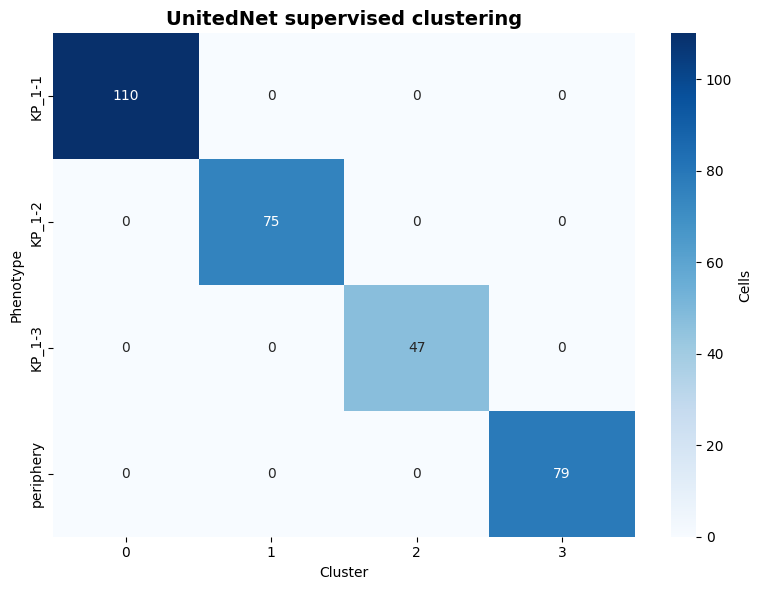

In [27]:
import numpy as np
import pandas as pd
import scanpy as sc
import pickle
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Paths
# ------------------------------------------------------------
model_path = Path("../Models/UnitedNet/perturbmap_activity_flux_niche_capboost_supervised_20251115_163122"
                  "/model_perturbmap_activity_flux_niche_capboost_supervised_KP2_1_supervised_20251115_163240.pkl")
data_path  = Path("../Data/UnitedNet/input_data")
dataset_id = "KP2_1"

# ------------------------------------------------------------
# 2. Load model
# ------------------------------------------------------------
with open(model_path, "rb") as f:
    model = pickle.load(f)

print("Loaded model.")
for attr in ["technique", "n_clusters", "n_classes_"]:
    if hasattr(model, attr):
        print(f"{attr}: {getattr(model, attr)}")

# ------------------------------------------------------------
# 3. Load modalities
# ------------------------------------------------------------
def load_mod(mod):
    tr = sc.read_h5ad(data_path / f"adata_{mod}_train_perturbmap_{dataset_id}.h5ad")
    te = sc.read_h5ad(data_path / f"adata_{mod}_test_perturbmap_{dataset_id}.h5ad")
    ad = sc.concat([tr, te], join="inner")
    ad.X = np.asarray(ad.X.toarray() if hasattr(ad.X, "toarray") else ad.X, dtype=np.float32)
    return ad

adata_activity = load_mod("activity")
adata_flux     = load_mod("flux")
adata_niche    = load_mod("niche")

adatas_all = [adata_activity, adata_flux, adata_niche]

print("Shapes:",
      adata_activity.X.shape,
      adata_flux.X.shape,
      adata_niche.X.shape)

# ------------------------------------------------------------
# 4. Predict labels
# ------------------------------------------------------------
y_pred = np.asarray(model.predict_label(adatas_all))
print("\nPredicted cluster labels:", np.unique(y_pred))
print("Cluster counts:", {c: np.sum(y_pred == c) for c in np.unique(y_pred)})

# ------------------------------------------------------------
# 5. Confusion matrix vs true phenotypes
# ------------------------------------------------------------
y_true = adata_activity.obs["phenotypes"].astype(str)

cm = pd.crosstab(y_true, y_pred, rownames=["Phenotype"], colnames=["Cluster"])
print("\nConfusion matrix:\n", cm)

# ------------------------------------------------------------
# 6. Heatmap
# ------------------------------------------------------------
# ------------------------------------------------------------
# 6. Heatmap
# ------------------------------------------------------------
import os
out_dir = "../Figures/Figure_1"
os.makedirs(out_dir, exist_ok=True)
outfile = os.path.join(out_dir, "confusion_heatmap.png")

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar_kws={"label": "Cells"})
plt.title("UnitedNet supervised clustering", fontsize=14, weight="bold")
plt.tight_layout()

# Save at 300 dpi
plt.savefig(outfile, dpi=300, bbox_inches="tight")
print(f"Saved heatmap → {outfile}")

plt.show()

This is the performance on cross-modal prediction

Saved R² confusion matrix → ../Figures/Figure_1/r2_confusion_matrix.png


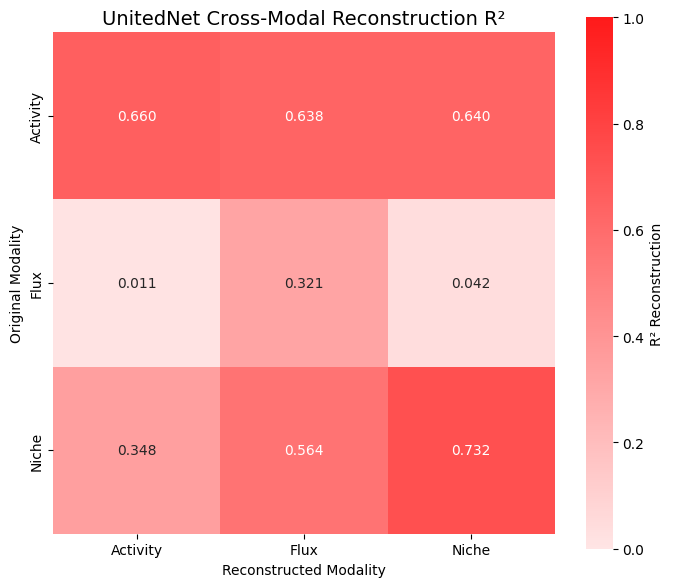

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# R² matrix
R2 = np.array([
    [0.6604591,  0.63837761, 0.63970125],
    [0.01093421, 0.32062101, 0.04206911],
    [0.34798285, 0.56359285, 0.7317611 ]
])

modalities = ["Activity", "Flux", "Niche"]

# ---- CUSTOM MONOCHROMATIC RED PALETTE ----
colors = ["#ffe5e5", "#ffb3b3", "#ff8080", "#ff4d4d", "#ff1a1a"]
red_cmap = LinearSegmentedColormap.from_list("red", colors)

plt.figure(figsize=(7, 6))
sns.heatmap(
    R2,
    annot=True,
    fmt=".3f",
    cmap=red_cmap,
    vmin=0, vmax=1,         # keep scale consistent
    xticklabels=modalities,
    yticklabels=modalities,
    square=True,
    cbar_kws={"label": "R² Reconstruction"}
)

plt.title("UnitedNet Cross-Modal Reconstruction R²", fontsize=14)
plt.xlabel("Reconstructed Modality")
plt.ylabel("Original Modality")
plt.tight_layout()

# Save at 300 dpi
out = "../Figures/Figure_1/r2_confusion_matrix.png"
plt.savefig(out, dpi=300, bbox_inches="tight")
print(f"Saved R² confusion matrix → {out}")

plt.show()

Saved combined multipanel figure → ../Figures/Figure_1/combined_confusion_R2.png


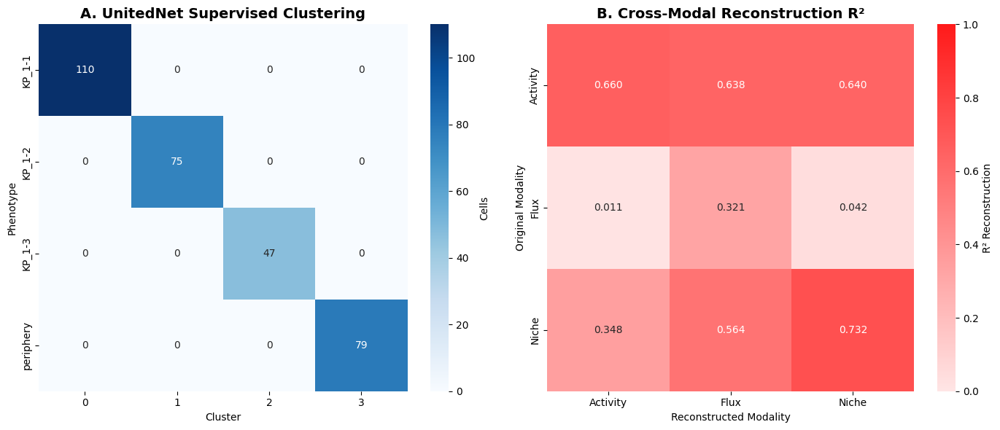

In [29]:
# ============================================================
# 7. Combined 1×2 Multipanel: Confusion Matrix + R² Matrix
# ============================================================
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Create output folder
out_dir = "../Figures/Figure_1"
os.makedirs(out_dir, exist_ok=True)
outfile = os.path.join(out_dir, "combined_confusion_R2.png")

# Custom red map
colors = ["#ffe5e5", "#ffb3b3", "#ff8080", "#ff4d4d", "#ff1a1a"]
red_cmap = LinearSegmentedColormap.from_list("red", colors)

# Create figure with 1×2 panels
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# ------------------------------------------------------------
# PANEL 1 — Supervised Confusion Matrix
# ------------------------------------------------------------
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar_kws={"label": "Cells"},
    ax=axes[0]
)
axes[0].set_title("A. UnitedNet Supervised Clustering", fontsize=14, weight="bold")
axes[0].set_xlabel("Cluster")
axes[0].set_ylabel("Phenotype")

# ------------------------------------------------------------
# PANEL 2 — R² Reconstruction Matrix
# ------------------------------------------------------------
sns.heatmap(
    R2,
    annot=True,
    fmt=".3f",
    cmap=red_cmap,
    vmin=0, vmax=1,
    xticklabels=modalities,
    yticklabels=modalities,
    square=True,
    cbar_kws={"label": "R² Reconstruction"},
    ax=axes[1]
)
axes[1].set_title("B. Cross-Modal Reconstruction R²", fontsize=14, weight="bold")
axes[1].set_xlabel("Reconstructed Modality")
axes[1].set_ylabel("Original Modality")

plt.tight_layout()

# Save at 300 dpi
plt.savefig(outfile, dpi=300, bbox_inches="tight")
print(f"Saved combined multipanel figure → {outfile}")

plt.show()

Saved combined multipanel figure → ../Figures/Figure_1/combined_confusion_R2.png


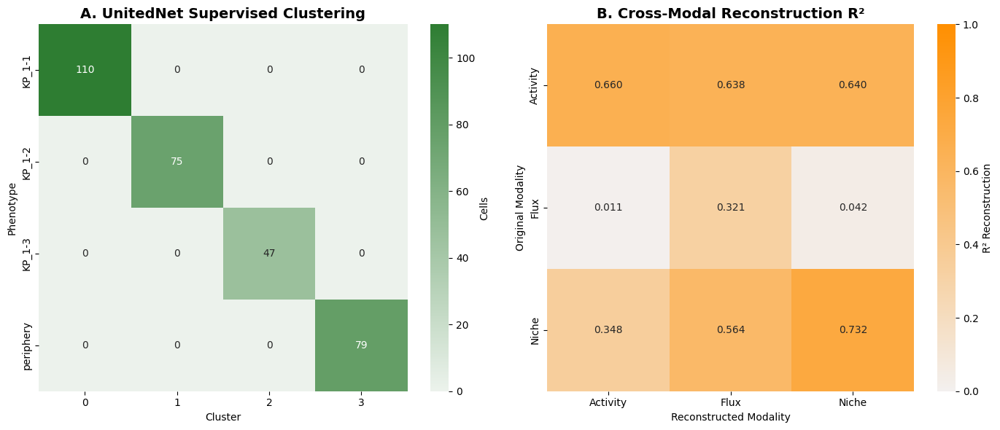

In [34]:
# ============================================================
# Combined Confusion Matrix + R² Matrix (Clean & Recolored)
# ============================================================
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Ensure output directory exists
out_dir = "../Figures/Figure_1"
os.makedirs(out_dir, exist_ok=True)
outfile = os.path.join(out_dir, "combined_confusion_R2.png")

# ============================================================
# 1. Define Color Palettes
# ============================================================

# Green sequential for confusion matrix
green_cmap = sns.light_palette("#2e7d32", as_cmap=True)   # forest green base

# Orange sequential for R² reconstruction
orange_cmap = sns.light_palette("#ff8f00", as_cmap=True)  # deep orange base


# ============================================================
# 2. Create Combined 1×2 Figure
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# -----------------------------
# PANEL A — Confusion Matrix
# -----------------------------
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap=green_cmap,
    cbar_kws={"label": "Cells"},
    ax=axes[0]
)
axes[0].set_title("A. UnitedNet Supervised Clustering", fontsize=14, weight="bold")
axes[0].set_xlabel("Cluster")
axes[0].set_ylabel("Phenotype")

# -----------------------------
# PANEL B — R² Reconstruction
# -----------------------------
sns.heatmap(
    R2,
    annot=True,
    fmt=".3f",
    cmap=orange_cmap,
    vmin=0,
    vmax=1,
    xticklabels=modalities,
    yticklabels=modalities,
    square=True,
    cbar_kws={"label": "R² Reconstruction"},
    ax=axes[1]
)
axes[1].set_title("B. Cross-Modal Reconstruction R²", fontsize=14, weight="bold")
axes[1].set_xlabel("Reconstructed Modality")
axes[1].set_ylabel("Original Modality")

# -----------------------------
# Final Layout & Save
# -----------------------------
plt.tight_layout()
plt.savefig(outfile, dpi=300, bbox_inches="tight")
print(f"Saved combined multipanel figure → {outfile}")

plt.show()


# 2. Chord plot for explainable Joint Group Identification

This has been already calculated by this code:

In [ ]:
# import sys
# sys.argv = [
#     "calculate_shap_values_capboost.py",
#     "--model_path", "../Models/UnitedNet/perturbmap_activity_flux_niche_capboost_supervised_20251115_163122/model_perturbmap_activity_flux_niche_capboost_supervised_KP2_1_supervised_20251115_163240.pkl",
#     "--data_path", "../Data/UnitedNet/input_data",
#     "--dataset_id", "KP2_1",
#     "--technique", "perturbmap_capboost",
#     "--top_k_features", "10",
#     "--output_dir", "../Task1_JGI"
# ]

# from calculate_shap_values_capboost import main
# main()

# 3. GenKI results

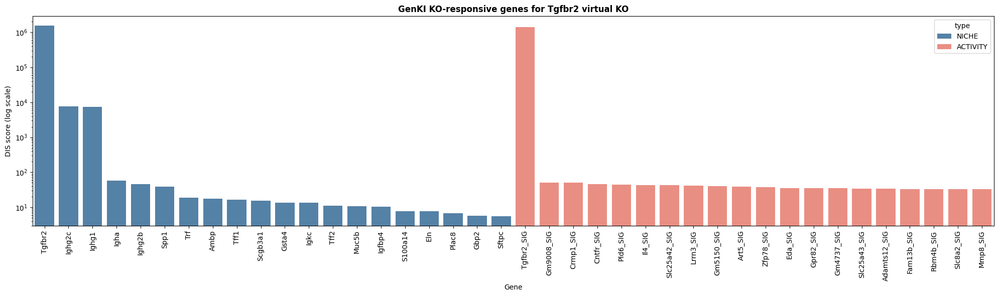

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------------------------------------
# Helper function
# ------------------------------------------------------------
def load_genki_csv(path):
    df = pd.read_csv(path)
    if df.columns[0].startswith("Unnamed"):
        df = df.rename(columns={df.columns[0]: "gene"})
    if "gene" not in df.columns:
        df = df.reset_index().rename(columns={"index": "gene"})
    return df

# ------------------------------------------------------------
# Load files
# ------------------------------------------------------------
niche_path = "../GenKI/GenKI_NB_Tgfbr2_20251115_171757/ALL_Significant_Genes_Combined.csv"
activity_path = "../GenKI/GenKI_NB_Tgfbr2_SIG_20251115_173901/ALL_Significant_Genes_Combined.csv"

df_niche = load_genki_csv(niche_path)
df_activity = load_genki_csv(activity_path)

# ------------------------------------------------------------
# Top 20 for each
# ------------------------------------------------------------
df_niche_top20 = df_niche.sort_values("dis", ascending=False).head(20)
df_niche_top20["type"] = "NICHE"

df_activity_top20 = df_activity.sort_values("dis", ascending=False).head(20)
df_activity_top20["type"] = "ACTIVITY"

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------
df_combined = pd.concat([df_niche_top20, df_activity_top20], ignore_index=True)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------
plt.figure(figsize=(20, 6))

sns.barplot(
    data=df_combined,
    x="gene",
    y="dis",
    hue="type",
    palette={"NICHE": "steelblue", "ACTIVITY": "salmon"}
)

plt.yscale("log")
plt.xticks(rotation=90)
plt.xlabel("Gene")
plt.ylabel("DIS score (log scale)")
plt.title("GenKI KO-responsive genes for Tgfbr2 virtual KO", fontweight="bold")
plt.tight_layout()

# ------------------------------------------------------------
# SAVE FIGURE (300 dpi)
# ------------------------------------------------------------
plt.savefig("../Figures/Figure_1/top20_dis_scores.png", 
            dpi=300, 
            bbox_inches="tight")

plt.show()

# 4. Alluvial plot

✓ Saved alluvial_unified_3column.html
  Nodes: 28 Niche → 37 Activity → 16 Niche2
  Links: 662 total edges


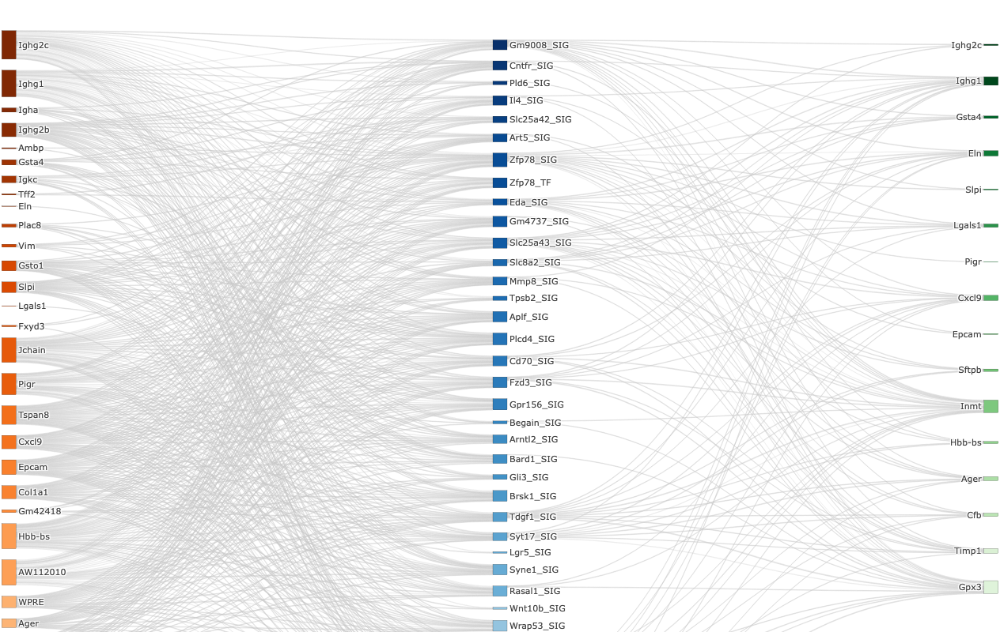

In [2]:
# #!/usr/bin/env python3
# """
# Unified 3-column Sankey: Niche → Activity → Niche2
# - Single integrated Sankey trace with three columns
# - Rank-based color gradients for each column
# - Stricter column positioning to prevent mixing
# """

# import pandas as pd
# import numpy as np
# import plotly.graph_objects as go
# from matplotlib import cm, colors as mpl_colors
# from pathlib import Path

# # ---------- LAYOUT KNOBS ----------
# WIDTH        = 1400
# HEIGHT       = 800
# FONT_SIZE    = 11
# NODE_THICK   = 18
# NODE_PAD     = 14
# V_SPREAD     = 0.88
# # ----------------------------------

# # ---------- USER INPUT ----------
# CSV1 = Path("../Mongoose_post_hoc/niche_to_activity_shap_edges_with_ranks_clusters45_20251115_180636.csv")
# CSV2 = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")

# CLUSTERS     = None
# MIN_WEIGHT   = 0.4
# TOP_N_EDGES  = None
# OUT_HTML     = "alluvial_unified_3column.html"
# SHOW_FIG     = True
# # ---------------------------------

# # ---------- helpers ----------
# def to_hex(v01, cmap="Oranges"):
#     rgba = cm.get_cmap(cmap)(float(np.clip(v01, 0, 1)))
#     return mpl_colors.to_hex(rgba)

# def side_colors(names, ranks, cmap, fallback_intensity=0.4):
#     arr = np.array(ranks, dtype=float)
#     finite = np.isfinite(arr)
#     if finite.any():
#         rmin, rmax = np.nanmin(arr[finite]), np.nanmax(arr[finite])
#         span = (rmax - rmin) if rmax != rmin else 1.0
#         v01  = np.where(finite, (rmax - arr) / span, np.nan)  # best→1
#         v01  = np.nan_to_num(v01, nan=0.15)
#         v01  = 0.15 + 0.85 * v01
#     else:
#         v01 = np.full(len(names), fallback_intensity)
#     return [to_hex(v, cmap) for v in v01], v01

# def order_by_rank(names, best_series):
#     recs = [(n, best_series.get(n, np.inf)) for n in names]
#     recs.sort(key=lambda t: (not np.isfinite(t[1]), t[1]))  # NaNs last
#     ordered_names  = [n for n, _ in recs]
#     ordered_ranks  = [r if np.isfinite(r) else np.nan for _, r in recs]
#     return ordered_names, ordered_ranks

# def _normalize_columns(df):
#     return df.rename(columns={
#         "Cluster":"cluster","Source":"source","Target":"target","Value":"value","Direction":"direction",
#         "Niche_rank":"niche_rank","Activity_rank":"activity_rank","Flux_rank":"flux_rank"
#     })

# def _local_y_positions(n, v_spread=0.88):
#     if n <= 1: return [0.5]
#     top    = (1.0 - v_spread) / 2.0
#     bottom = 1.0 - top
#     return np.linspace(top, bottom, n).tolist()

# def load_and_prep_edges(csv_path, clusters=None, min_weight=0.5, top_n_edges=None):
#     """Load CSV and return cleaned edge dataframe"""
#     df = pd.read_csv(csv_path)
#     df = _normalize_columns(df)
    
#     if clusters is not None and "cluster" in df.columns:
#         df = df[df["cluster"].isin(clusters)].copy()
    
#     for c in ["value","niche_rank","activity_rank","flux_rank"]:
#         if c in df.columns: 
#             df[c] = pd.to_numeric(df[c], errors="coerce")
    
#     df = df.dropna(subset=["source","target","value"])
    
#     edges = (df.groupby(["source","target"], as_index=False)["value"].sum()
#                .sort_values("value", ascending=False))
#     edges = edges[edges["value"] >= min_weight]
#     if top_n_edges: 
#         edges = edges.head(top_n_edges)
    
#     return edges, df

# # ---------- main ----------
# def main():
#     # Load both datasets
#     edges1, df1 = load_and_prep_edges(CSV1, CLUSTERS, MIN_WEIGHT, TOP_N_EDGES)
#     edges2, df2 = load_and_prep_edges(CSV2, CLUSTERS, MIN_WEIGHT, TOP_N_EDGES)
    
#     if edges1.empty or edges2.empty:
#         raise SystemExit("No edges after filtering. Relax MIN_WEIGHT/TOP_N_EDGES.")
    
#     # Extract unique nodes for each column - use prefixes to ensure uniqueness
#     niche_nodes = [f"NICHE1::{x}" for x in edges1["source"].astype(str).unique()]
#     activity_nodes = [f"ACTIVITY::{x}" for x in np.unique(np.concatenate([
#         edges1["target"].astype(str).unique(),
#         edges2["source"].astype(str).unique()
#     ]))]
#     niche2_nodes = [f"NICHE2::{x}" for x in edges2["target"].astype(str).unique()]
    
#     # Get ranks for ordering and coloring (use original names without prefix)
#     niche_ranks = df1.groupby("source")["niche_rank"].min()
#     activity_ranks = pd.concat([
#         df1.groupby("target")["activity_rank"].min(),
#         df2.groupby("source")["activity_rank"].min()
#     ]).groupby(level=0).min()
#     niche2_ranks = df2.groupby("target")["niche_rank"].min()
    
#     # Order nodes by rank (extract original name for ranking)
#     def extract_name(prefixed):
#         return prefixed.split("::", 1)[1]
    
#     niche_orig = [extract_name(n) for n in niche_nodes]
#     activity_orig = [extract_name(n) for n in activity_nodes]
#     niche2_orig = [extract_name(n) for n in niche2_nodes]
    
#     ordered_niche, niche_rank_vals = order_by_rank(niche_orig, niche_ranks)
#     ordered_activity, activity_rank_vals = order_by_rank(activity_orig, activity_ranks)
#     ordered_niche2, niche2_rank_vals = order_by_rank(niche2_orig, niche2_ranks)
    
#     # Re-add prefixes after ordering
#     ordered_niche = [f"NICHE1::{x}" for x in ordered_niche]
#     ordered_activity = [f"ACTIVITY::{x}" for x in ordered_activity]
#     ordered_niche2 = [f"NICHE2::{x}" for x in ordered_niche2]
    
#     # Generate colors
#     niche_colors, _ = side_colors(ordered_niche, niche_rank_vals, "Oranges")
#     activity_colors, _ = side_colors(ordered_activity, activity_rank_vals, "Blues")
#     niche2_colors, _ = side_colors(ordered_niche2, niche2_rank_vals, "Greens")
    
#     # Combine all nodes
#     all_nodes = ordered_niche + ordered_activity + ordered_niche2
#     all_colors = niche_colors + activity_colors + niche2_colors
#     node_idx = {n: i for i, n in enumerate(all_nodes)}
    
#     # For display, remove prefixes
#     display_labels = [extract_name(n) for n in all_nodes]
    
#     # Calculate positions
#     n_niche = len(ordered_niche)
#     n_activity = len(ordered_activity)
#     n_niche2 = len(ordered_niche2)
    
#     y_niche = _local_y_positions(n_niche, V_SPREAD)
#     y_activity = _local_y_positions(n_activity, V_SPREAD)
#     y_niche2 = _local_y_positions(n_niche2, V_SPREAD)
    
#     # X positions for three columns - use snap positioning
#     x_positions = (
#         [0.001] * n_niche +          # Column 1: Niche (far left)
#         [0.500] * n_activity +       # Column 2: Activity (middle)
#         [0.999] * n_niche2           # Column 3: Niche2 (far right)
#     )
    
#     y_positions = y_niche + y_activity + y_niche2
    
#     # Build links with prefixed node names
#     links_source = []
#     links_target = []
#     links_value = []
    
#     # Links from Niche → Activity
#     for _, row in edges1.iterrows():
#         src = f"NICHE1::{str(row['source'])}"
#         tgt = f"ACTIVITY::{str(row['target'])}"
#         if src in node_idx and tgt in node_idx:
#             links_source.append(node_idx[src])
#             links_target.append(node_idx[tgt])
#             links_value.append(float(row["value"]))
    
#     # Links from Activity → Niche2
#     for _, row in edges2.iterrows():
#         src = f"ACTIVITY::{str(row['source'])}"
#         tgt = f"NICHE2::{str(row['target'])}"
#         if src in node_idx and tgt in node_idx:
#             links_source.append(node_idx[src])
#             links_target.append(node_idx[tgt])
#             links_value.append(float(row["value"]))
    
#     # Create unified Sankey with snap arrangement
#     fig = go.Figure(data=[go.Sankey(
#         arrangement="snap",  # Changed from "fixed" to "snap"
#         node=dict(
#             pad=NODE_PAD,
#             thickness=NODE_THICK,
#             line=dict(color="black", width=0.2),
#             label=display_labels,  # Show clean labels without prefixes
#             color=all_colors,
#             x=x_positions,
#             y=y_positions,
#             hovertemplate="%{label}<extra></extra>",
#         ),
#         link=dict(
#             source=links_source,
#             target=links_target,
#             value=links_value,
#             color=["rgba(200,200,200,0.35)"] * len(links_source),
#             line=dict(width=0),
#             hovertemplate="Source: %{source.label}<br>Target: %{target.label}<br>Weight: %{value:.3g}<extra></extra>",
#         )
#     )])
    
#     fig.update_layout(
#         font=dict(size=FONT_SIZE),
#         height=HEIGHT, 
#         width=WIDTH,
#         margin=dict(l=10, r=10, t=10, b=10),
#         template="none",
#         paper_bgcolor="rgba(0,0,0,0)",
#         plot_bgcolor="rgba(0,0,0,0)",
#     )
    
#     fig.update_xaxes(visible=False)
#     fig.update_yaxes(visible=False)
    
#     fig.write_html(OUT_HTML, include_plotlyjs="cdn")
#     print(f"✓ Saved {OUT_HTML}")
#     print(f"  Nodes: {n_niche} Niche → {n_activity} Activity → {n_niche2} Niche2")
#     print(f"  Links: {len(links_source)} total edges")
    
#     if SHOW_FIG:
#         fig.show()

# if __name__ == "__main__":
#     main()


GENE LISTS (from filtered edges)

ACTIVITY GENES (source, suffixes removed): 36 genes
----------------------------------------------------------------------
Abca8b
Aplf
Arntl2
Art5
Bard1
Begain
Brsk1
Cd70
Cntfr
Cyp2j9
Eda
Fzd3
Gli3
Gm4737
Gm9008
Gpr156
Gtdc1
Gxylt2
Il4
Lgr5
Mmp8
Nat8
Plcd4
Pld6
Rasal1
Slc25a42
Slc25a43
Slc8a2
Syne1
Syt17
Tdgf1
Tpsb2
Unc5a
Wnt10b
Wrap53
Zfp78

NICHE GENES (target): 33 genes
----------------------------------------------------------------------
AW112010
Ager
Ambp
Cfb
Col1a1
Cxcl9
Eln
Epcam
Fxyd3
Gm42418
Gpx3
Gsta4
Gsto1
Hba-a1
Hbb-bs
Igha
Ighg1
Ighg2b
Ighg2c
Igkc
Inmt
Jchain
Lgals1
Pigr
Plac8
S100a14
Sftpb
Slpi
Tff2
Timp1
Tspan8
Vim
WPRE

SUMMARY:
  Activity genes: 36
  Niche genes: 33
  Total edges: 801

✓ Saved activity_genes_no_suffix.csv
✓ Saved niche_genes.csv

✓ Saved alluvial_activity_to_niche.html
  Nodes: 37 Activity → 33 Niche
  Links: 801 total edges



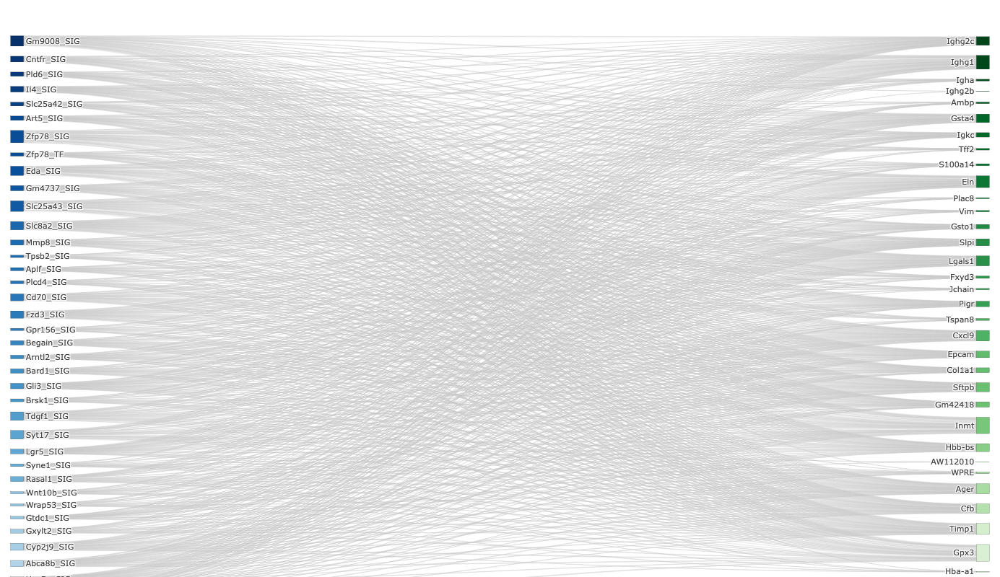

In [16]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from matplotlib import cm, colors as mpl_colors
from pathlib import Path

# ---------- LAYOUT KNOBS ----------
WIDTH        = 1200
HEIGHT       = 800
FONT_SIZE    = 11
NODE_THICK   = 18
NODE_PAD     = 14
V_SPREAD     = 0.88
# ----------------------------------

# ---------- USER INPUT ----------
CSV2 = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")

CLUSTERS     = None
MIN_WEIGHT   = 0.1
TOP_N_EDGES  = None
OUT_HTML     = "alluvial_activity_to_niche.html"
SHOW_FIG     = True
# ---------------------------------

# ---------- helpers ----------
def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from gene names"""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene

def to_hex(v01, cmap="Oranges"):
    rgba = cm.get_cmap(cmap)(float(np.clip(v01, 0, 1)))
    return mpl_colors.to_hex(rgba)

def side_colors(names, ranks, cmap, fallback_intensity=0.4):
    arr = np.array(ranks, dtype=float)
    finite = np.isfinite(arr)
    if finite.any():
        rmin, rmax = np.nanmin(arr[finite]), np.nanmax(arr[finite])
        span = (rmax - rmin) if rmax != rmin else 1.0
        v01  = np.where(finite, (rmax - arr) / span, np.nan)  # best→1
        v01  = np.nan_to_num(v01, nan=0.15)
        v01  = 0.15 + 0.85 * v01
    else:
        v01 = np.full(len(names), fallback_intensity)
    return [to_hex(v, cmap) for v in v01], v01

def order_by_rank(names, best_series):
    recs = [(n, best_series.get(n, np.inf)) for n in names]
    recs.sort(key=lambda t: (not np.isfinite(t[1]), t[1]))  # NaNs last
    ordered_names  = [n for n, _ in recs]
    ordered_ranks  = [r if np.isfinite(r) else np.nan for _, r in recs]
    return ordered_names, ordered_ranks

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster":"cluster","Source":"source","Target":"target","Value":"value","Direction":"direction",
        "Niche_rank":"niche_rank","Activity_rank":"activity_rank","Flux_rank":"flux_rank"
    })

def _local_y_positions(n, v_spread=0.88):
    if n <= 1: return [0.5]
    top    = (1.0 - v_spread) / 2.0
    bottom = 1.0 - top
    return np.linspace(top, bottom, n).tolist()

def load_and_prep_edges(csv_path, clusters=None, min_weight=0.5, top_n_edges=None):
    """Load CSV and return cleaned edge dataframe"""
    df = pd.read_csv(csv_path)
    df = _normalize_columns(df)
    
    if clusters is not None and "cluster" in df.columns:
        df = df[df["cluster"].isin(clusters)].copy()
    
    for c in ["value","niche_rank","activity_rank","flux_rank"]:
        if c in df.columns: 
            df[c] = pd.to_numeric(df[c], errors="coerce")
    
    df = df.dropna(subset=["source","target","value"])
    
    edges = (df.groupby(["source","target"], as_index=False)["value"].sum()
               .sort_values("value", ascending=False))
    edges = edges[edges["value"] >= min_weight]
    if top_n_edges: 
        edges = edges.head(top_n_edges)
    
    return edges, df

# ---------- main ----------
def main():
    # Load CSV2 only
    edges, df = load_and_prep_edges(CSV2, CLUSTERS, MIN_WEIGHT, TOP_N_EDGES)
    
    if edges.empty:
        raise SystemExit("No edges after filtering. Relax MIN_WEIGHT/TOP_N_EDGES.")
    
    # Extract unique nodes for each column
    activity_nodes = edges["source"].astype(str).unique()
    niche_nodes = edges["target"].astype(str).unique()
    
    # Remove suffixes from activity genes and get unique set
    activity_genes_clean = sorted(list(set([remove_suffix(g) for g in activity_nodes])))
    niche_genes = sorted(list(niche_nodes))
    
    # Print gene lists
    print("\n" + "="*70)
    print("GENE LISTS (from filtered edges)")
    print("="*70)
    
    print(f"\nACTIVITY GENES (source, suffixes removed): {len(activity_genes_clean)} genes")
    print("-"*70)
    for gene in activity_genes_clean:
        print(gene)
    
    print(f"\n{'='*70}")
    print(f"NICHE GENES (target): {len(niche_genes)} genes")
    print("-"*70)
    for gene in niche_genes:
        print(gene)
    
    print(f"\n{'='*70}")
    print(f"SUMMARY:")
    print(f"  Activity genes: {len(activity_genes_clean)}")
    print(f"  Niche genes: {len(niche_genes)}")
    print(f"  Total edges: {len(edges)}")
    print("="*70 + "\n")
    
    # Export to CSV files
    pd.DataFrame({"Activity_Gene": activity_genes_clean}).to_csv(
        "activity_genes_no_suffix.csv", index=False
    )
    pd.DataFrame({"Niche_Gene": niche_genes}).to_csv(
        "niche_genes.csv", index=False
    )
    print("✓ Saved activity_genes_no_suffix.csv")
    print("✓ Saved niche_genes.csv\n")
    
    # Get ranks for ordering and coloring
    activity_ranks = df.groupby("source")["activity_rank"].min() if "activity_rank" in df.columns else pd.Series(dtype=float)
    niche_ranks = df.groupby("target")["niche_rank"].min() if "niche_rank" in df.columns else pd.Series(dtype=float)
    
    # Order nodes by rank
    if len(activity_ranks) > 0:
        ordered_activity, activity_rank_vals = order_by_rank(activity_nodes, activity_ranks)
    else:
        ordered_activity, activity_rank_vals = list(activity_nodes), [np.nan]*len(activity_nodes)
        
    if len(niche_ranks) > 0:
        ordered_niche, niche_rank_vals = order_by_rank(niche_nodes, niche_ranks)
    else:
        ordered_niche, niche_rank_vals = list(niche_nodes), [np.nan]*len(niche_nodes)
    
    # Generate colors
    activity_colors, _ = side_colors(ordered_activity, activity_rank_vals, "Blues")
    niche_colors, _ = side_colors(ordered_niche, niche_rank_vals, "Greens")
    
    # Combine all nodes
    all_nodes = ordered_activity + ordered_niche
    all_colors = activity_colors + niche_colors
    node_idx = {n: i for i, n in enumerate(all_nodes)}
    
    # Calculate positions
    n_activity = len(ordered_activity)
    n_niche = len(ordered_niche)
    
    y_activity = _local_y_positions(n_activity, V_SPREAD)
    y_niche = _local_y_positions(n_niche, V_SPREAD)
    
    # X positions for two columns
    x_positions = (
        [0.01] * n_activity +        # Column 1: Activity (left)
        [0.99] * n_niche             # Column 2: Niche (right)
    )
    
    y_positions = y_activity + y_niche
    
    # Build links
    links_source = []
    links_target = []
    links_value = []
    
    # Links from Activity → Niche
    for _, row in edges.iterrows():
        src = str(row["source"])
        tgt = str(row["target"])
        if src in node_idx and tgt in node_idx:
            links_source.append(node_idx[src])
            links_target.append(node_idx[tgt])
            links_value.append(float(row["value"]))
    
    # Create Sankey
    fig = go.Figure(data=[go.Sankey(
        arrangement="snap",
        node=dict(
            pad=NODE_PAD,
            thickness=NODE_THICK,
            line=dict(color="black", width=0.2),
            label=all_nodes,
            color=all_colors,
            x=x_positions,
            y=y_positions,
            hovertemplate="%{label}<extra></extra>",
        ),
        link=dict(
            source=links_source,
            target=links_target,
            value=links_value,
            color=["rgba(200,200,200,0.35)"] * len(links_source),
            line=dict(width=0),
            hovertemplate="Source: %{source.label}<br>Target: %{target.label}<br>Weight: %{value:.3g}<extra></extra>",
        )
    )])
    
    fig.update_layout(
        font=dict(size=FONT_SIZE),
        height=HEIGHT, 
        width=WIDTH,
        margin=dict(l=10, r=10, t=10, b=10),
        template="none",
        paper_bgcolor="rgba(0,0,0,0)",
        plot_bgcolor="rgba(0,0,0,0)",
    )
    
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)
    
    fig.write_html(OUT_HTML, include_plotlyjs="cdn")
    print(f"✓ Saved {OUT_HTML}")
    print(f"  Nodes: {n_activity} Activity → {n_niche} Niche")
    print(f"  Links: {len(links_source)} total edges\n")
    
    if SHOW_FIG:
        fig.show()

if __name__ == "__main__":
    main()


Activity → Niche edges: 12
Niche → Flux edges: 88

Nodes per column:
  Activity: 6
  Niche: 15
  Flux: 47

✓ Saved alluvial_activity_niche_flux.html
  Nodes: 6 Activity → 15 Niche → 47 Flux
  Links: 100 total edges

GENE/FLUX LISTS

ACTIVITY GENES: 6
----------------------------------------------------------------------
Eda
Gm9008
Slc25a43
Syt17
Tdgf1
Zfp78

NICHE GENES: 15
----------------------------------------------------------------------
AW112010
Eln
Fxyd3
Gpx3
Gsto1
Hbb-bs
Igha
Ighg1
Ighg2b
Ighg2c
Igkc
Inmt
Jchain
Pigr
Tspan8

FLUX METABOLITES: 47
----------------------------------------------------------------------
(E,E)-Farnesyl-PP
(Gal)2 (GlcA)1 (Xyl)1 (Ser)1
(Glc)3 (GlcNAc)2 (Man)9 (Asn)1
(GlcNAc)4 (Man)3 (Asn)1
2OG
3PD
AICAR
AMP
Acetyl-CoA
Aspartate
B-Alanine
CDP
Cholesterol
Choline
Chondroitin
Citrate
Cysteine
Deoxyadenosine
Dolichyl phosphate
Fatty Acid
Fumarate
G3P
G6P
Glucose
Glutamate
Glutathione
Glycine
Histidine
Hypoxanthine
IMP
Isoleucine
Lactate
Leucine
Methionin

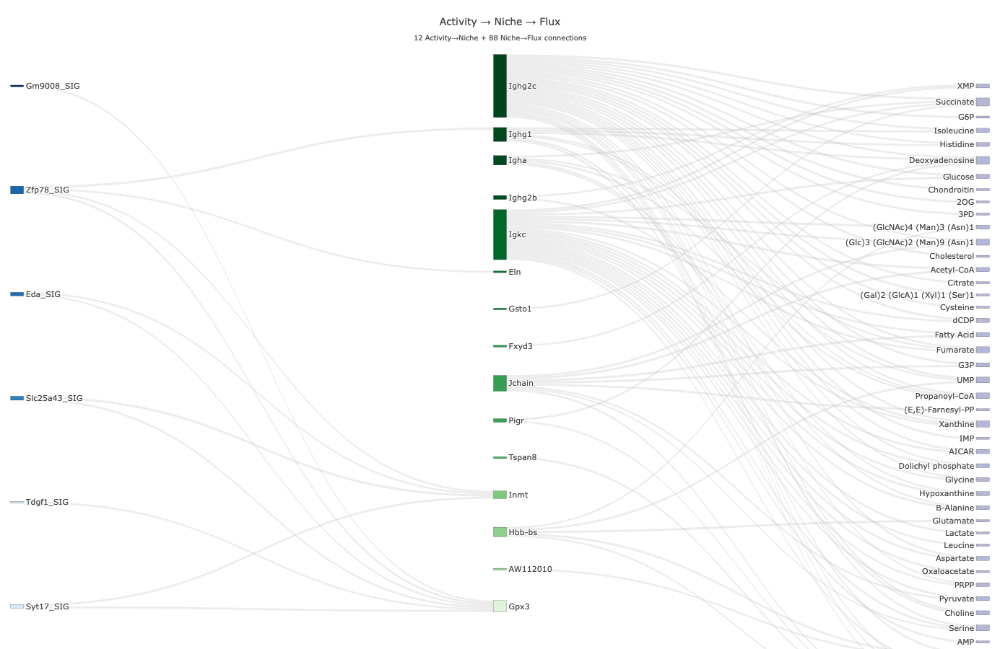

In [39]:
#!/usr/bin/env python3
"""
3-column Sankey: Activity → Niche → Flux
- Combines two CSVs to create 3-tier flow
- Rank-based color gradients for each column
"""

import pandas as pd
import numpy as np
import plotly.graph_objects as go
from matplotlib import cm, colors as mpl_colors
from pathlib import Path

# ---------- LAYOUT KNOBS ----------
WIDTH        = 1600
HEIGHT       = 900
FONT_SIZE    = 11
NODE_THICK   = 18
NODE_PAD     = 14
V_SPREAD     = 0.88
# ----------------------------------

# ---------- USER INPUT ----------
CSV_ACTIVITY_TO_NICHE = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")
CSV_NICHE_TO_FLUX = Path("../Mongoose_post_hoc/niche_to_flux_shap_edges_with_ranks_cluster0_20251207_201807.csv")

CLUSTERS     = None
MIN_WEIGHT   = 0.8
TOP_N_EDGES  = None
OUT_HTML     = "alluvial_activity_niche_flux.html"
SHOW_FIG     = True
# ---------------------------------

# ---------- helpers ----------
def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from gene names"""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene

def to_hex(v01, cmap="Oranges"):
    rgba = cm.get_cmap(cmap)(float(np.clip(v01, 0, 1)))
    return mpl_colors.to_hex(rgba)

def side_colors(names, ranks, cmap, fallback_intensity=0.4):
    arr = np.array(ranks, dtype=float)
    finite = np.isfinite(arr)
    if finite.any():
        rmin, rmax = np.nanmin(arr[finite]), np.nanmax(arr[finite])
        span = (rmax - rmin) if rmax != rmin else 1.0
        v01  = np.where(finite, (rmax - arr) / span, np.nan)  # best→1
        v01  = np.nan_to_num(v01, nan=0.15)
        v01  = 0.15 + 0.85 * v01
    else:
        v01 = np.full(len(names), fallback_intensity)
    return [to_hex(v, cmap) for v in v01], v01

def order_by_rank(names, best_series):
    recs = [(n, best_series.get(n, np.inf)) for n in names]
    recs.sort(key=lambda t: (not np.isfinite(t[1]), t[1]))  # NaNs last
    ordered_names  = [n for n, _ in recs]
    ordered_ranks  = [r if np.isfinite(r) else np.nan for _, r in recs]
    return ordered_names, ordered_ranks

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster":"cluster","Source":"source","Target":"target","Value":"value","Direction":"direction",
        "Niche_rank":"niche_rank","Activity_rank":"activity_rank","Flux_rank":"flux_rank"
    })

def _local_y_positions(n, v_spread=0.88):
    if n <= 1: return [0.5]
    top    = (1.0 - v_spread) / 2.0
    bottom = 1.0 - top
    return np.linspace(top, bottom, n).tolist()

def load_and_prep_edges(csv_path, clusters=None, min_weight=0.5, top_n_edges=None):
    """Load CSV and return cleaned edge dataframe"""
    df = pd.read_csv(csv_path)
    df = _normalize_columns(df)
    
    if clusters is not None and "cluster" in df.columns:
        df = df[df["cluster"].isin(clusters)].copy()
    
    for c in ["value","niche_rank","activity_rank","flux_rank"]:
        if c in df.columns: 
            df[c] = pd.to_numeric(df[c], errors="coerce")
    
    df = df.dropna(subset=["source","target","value"])
    
    edges = (df.groupby(["source","target"], as_index=False)["value"].sum()
               .sort_values("value", ascending=False))
    edges = edges[edges["value"] >= min_weight]
    if top_n_edges: 
        edges = edges.head(top_n_edges)
    
    return edges, df

# ---------- main ----------
def main():
    # Load both CSVs
    edges1, df1 = load_and_prep_edges(CSV_ACTIVITY_TO_NICHE, CLUSTERS, MIN_WEIGHT, TOP_N_EDGES)
    edges2, df2 = load_and_prep_edges(CSV_NICHE_TO_FLUX, CLUSTERS, MIN_WEIGHT, TOP_N_EDGES)
    
    if edges1.empty:
        raise SystemExit("No edges in Activity→Niche. Relax MIN_WEIGHT/TOP_N_EDGES.")
    if edges2.empty:
        raise SystemExit("No edges in Niche→Flux. Relax MIN_WEIGHT/TOP_N_EDGES.")
    
    print(f"\nActivity → Niche edges: {len(edges1)}")
    print(f"Niche → Flux edges: {len(edges2)}")
    
    # Extract unique nodes for each column
    activity_nodes = edges1["source"].astype(str).unique()
    
    # Niche nodes appear as targets in edges1 and sources in edges2
    niche_nodes_from_edges1 = edges1["target"].astype(str).unique()
    niche_nodes_from_edges2 = edges2["source"].astype(str).unique()
    niche_nodes = np.unique(np.concatenate([niche_nodes_from_edges1, niche_nodes_from_edges2]))
    
    flux_nodes = edges2["target"].astype(str).unique()
    
    print(f"\nNodes per column:")
    print(f"  Activity: {len(activity_nodes)}")
    print(f"  Niche: {len(niche_nodes)}")
    print(f"  Flux: {len(flux_nodes)}")
    
    # Get ranks for ordering and coloring
    activity_ranks = df1.groupby("source")["activity_rank"].min() if "activity_rank" in df1.columns else pd.Series(dtype=float)
    
    # Niche ranks from both dataframes
    niche_ranks_from_df1 = df1.groupby("target")["niche_rank"].min() if "niche_rank" in df1.columns else pd.Series(dtype=float)
    niche_ranks_from_df2 = df2.groupby("source")["niche_rank"].min() if "niche_rank" in df2.columns else pd.Series(dtype=float)
    niche_ranks = pd.concat([niche_ranks_from_df1, niche_ranks_from_df2]).groupby(level=0).min()
    
    flux_ranks = df2.groupby("target")["flux_rank"].min() if "flux_rank" in df2.columns else pd.Series(dtype=float)
    
    # Order nodes by rank
    if len(activity_ranks) > 0:
        ordered_activity, activity_rank_vals = order_by_rank(activity_nodes, activity_ranks)
    else:
        ordered_activity, activity_rank_vals = list(activity_nodes), [np.nan]*len(activity_nodes)
        
    if len(niche_ranks) > 0:
        ordered_niche, niche_rank_vals = order_by_rank(niche_nodes, niche_ranks)
    else:
        ordered_niche, niche_rank_vals = list(niche_nodes), [np.nan]*len(niche_nodes)
        
    if len(flux_ranks) > 0:
        ordered_flux, flux_rank_vals = order_by_rank(flux_nodes, flux_ranks)
    else:
        ordered_flux, flux_rank_vals = list(flux_nodes), [np.nan]*len(flux_nodes)
    
    # Generate colors
    activity_colors, _ = side_colors(ordered_activity, activity_rank_vals, "Blues")
    niche_colors, _ = side_colors(ordered_niche, niche_rank_vals, "Greens")
    flux_colors, _ = side_colors(ordered_flux, flux_rank_vals, "Purples")
    
    # Combine all nodes
    all_nodes = ordered_activity + ordered_niche + ordered_flux
    all_colors = activity_colors + niche_colors + flux_colors
    node_idx = {n: i for i, n in enumerate(all_nodes)}
    
    # Calculate positions
    n_activity = len(ordered_activity)
    n_niche = len(ordered_niche)
    n_flux = len(ordered_flux)
    
    y_activity = _local_y_positions(n_activity, V_SPREAD)
    y_niche = _local_y_positions(n_niche, V_SPREAD)
    y_flux = _local_y_positions(n_flux, V_SPREAD)
    
    # X positions for three columns
    x_positions = (
        [0.01] * n_activity +        # Column 1: Activity (left)
        [0.50] * n_niche +           # Column 2: Niche (middle)
        [0.99] * n_flux              # Column 3: Flux (right)
    )
    
    y_positions = y_activity + y_niche + y_flux
    
    # Build links
    links_source = []
    links_target = []
    links_value = []
    
    # Links from Activity → Niche
    for _, row in edges1.iterrows():
        src = str(row["source"])
        tgt = str(row["target"])
        if src in node_idx and tgt in node_idx:
            links_source.append(node_idx[src])
            links_target.append(node_idx[tgt])
            links_value.append(float(row["value"]))
    
    # Links from Niche → Flux
    for _, row in edges2.iterrows():
        src = str(row["source"])
        tgt = str(row["target"])
        if src in node_idx and tgt in node_idx:
            links_source.append(node_idx[src])
            links_target.append(node_idx[tgt])
            links_value.append(float(row["value"]))
    
    # Create Sankey
    fig = go.Figure(data=[go.Sankey(
        arrangement="snap",
        node=dict(
            pad=NODE_PAD,
            thickness=NODE_THICK,
            line=dict(color="black", width=0.2),
            label=all_nodes,
            color=all_colors,
            x=x_positions,
            y=y_positions,
            hovertemplate="%{label}<extra></extra>",
        ),
        link=dict(
            source=links_source,
            target=links_target,
            value=links_value,
            color=["rgba(200,200,200,0.35)"] * len(links_source),
            line=dict(width=0),
            hovertemplate="Source: %{source.label}<br>Target: %{target.label}<br>Weight: %{value:.3g}<extra></extra>",
        )
    )])
    
    fig.update_layout(
        title=dict(
            text=f"Activity → Niche → Flux<br><sub>{len(edges1)} Activity→Niche + {len(edges2)} Niche→Flux connections</sub>",
            font=dict(size=14)
        ),
        font=dict(size=FONT_SIZE),
        height=HEIGHT, 
        width=WIDTH,
        margin=dict(l=10, r=10, t=70, b=10),
        template="none",
        paper_bgcolor="rgba(0,0,0,0)",
        plot_bgcolor="rgba(0,0,0,0)",
    )
    
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)
    
    fig.write_html(OUT_HTML, include_plotlyjs="cdn")
    print(f"\n✓ Saved {OUT_HTML}")
    print(f"  Nodes: {n_activity} Activity → {n_niche} Niche → {n_flux} Flux")
    print(f"  Links: {len(links_source)} total edges\n")
    
    # Print gene lists
    activity_genes_clean = sorted(list(set([remove_suffix(g) for g in activity_nodes])))
    niche_genes = sorted(list(niche_nodes))
    flux_genes = sorted(list(flux_nodes))
    
    print("="*70)
    print("GENE/FLUX LISTS")
    print("="*70)
    
    print(f"\nACTIVITY GENES: {len(activity_genes_clean)}")
    print("-"*70)
    for gene in activity_genes_clean:
        print(gene)
    
    print(f"\n{'='*70}")
    print(f"NICHE GENES: {len(niche_genes)}")
    print("-"*70)
    for gene in niche_genes:
        print(gene)
    
    print(f"\n{'='*70}")
    print(f"FLUX METABOLITES: {len(flux_genes)}")
    print("-"*70)
    for flux in flux_genes:
        print(flux)
    
    print(f"\n{'='*70}")
    print(f"SUMMARY:")
    print(f"  Activity genes: {len(activity_genes_clean)}")
    print(f"  Niche genes: {len(niche_genes)}")
    print(f"  Flux metabolites: {len(flux_genes)}")
    print(f"  Total edges: {len(edges1) + len(edges2)}")
    print("="*70 + "\n")
    
    # Export to CSV files
    pd.DataFrame({"Activity_Gene": activity_genes_clean}).to_csv(
        "activity_genes_no_suffix.csv", index=False
    )
    pd.DataFrame({"Niche_Gene": niche_genes}).to_csv(
        "niche_genes.csv", index=False
    )
    pd.DataFrame({"Flux_Metabolite": flux_genes}).to_csv(
        "flux_metabolites.csv", index=False
    )
    print("✓ Saved activity_genes_no_suffix.csv")
    print("✓ Saved niche_genes.csv")
    print("✓ Saved flux_metabolites.csv\n")
    
    if SHOW_FIG:
        fig.show()

if __name__ == "__main__":
    main()

MODULE ENRICHMENT ANALYSIS FOR NICHE GENES

Loaded 33 niche genes from niche_genes.csv
Loading module mapping from ../Data/fluxestimator/module_gene_complete_mouse_m168.csv...
Loaded 168 modules
Background: 719 unique genes across all modules

Performing enrichment analysis...

ENRICHMENT RESULTS

Modules with FDR < 0.05: 0/1

Top 20 enriched modules:
--------------------------------------------------------------------------------

M_25
  Overlap: 2/32 genes
  Fold Enrichment: 1.36x
  P-value: 4.39e-01
  FDR: 4.39e-01
  Genes: GSTA4, GSTO1

✓ Saved niche_module_enrichment_full_results.csv

Generating plots...
✓ Saved niche_module_enrichment_barplot.png


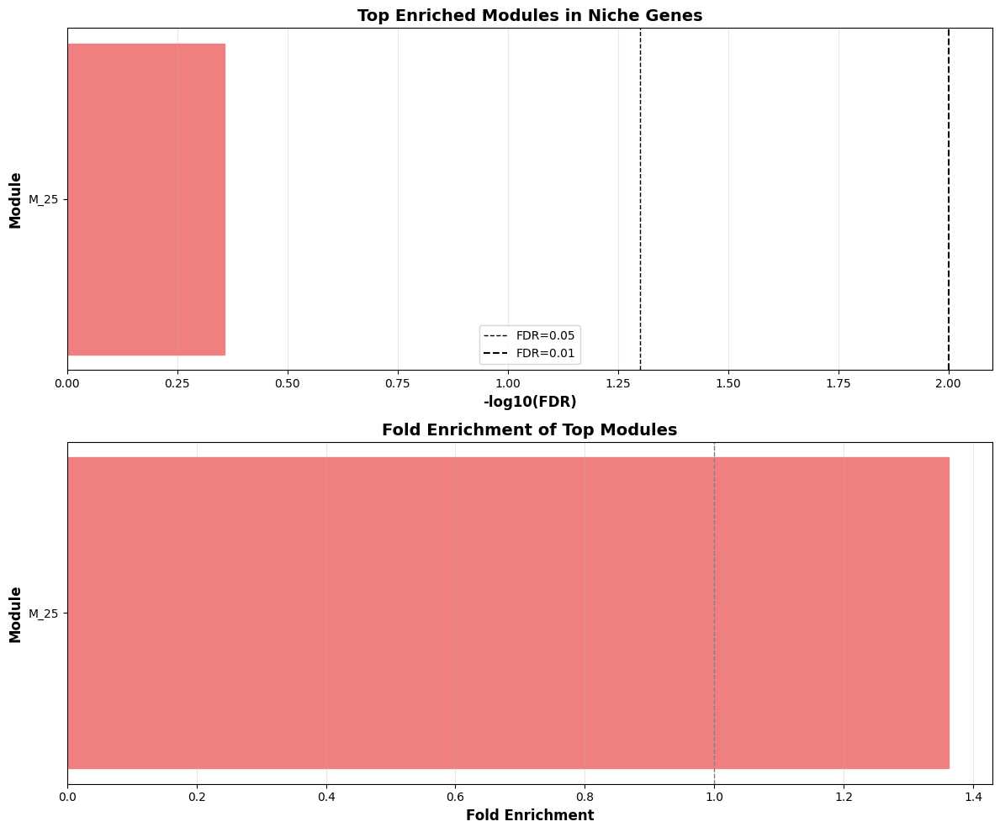

✓ Saved niche_module_enrichment_scatter.png


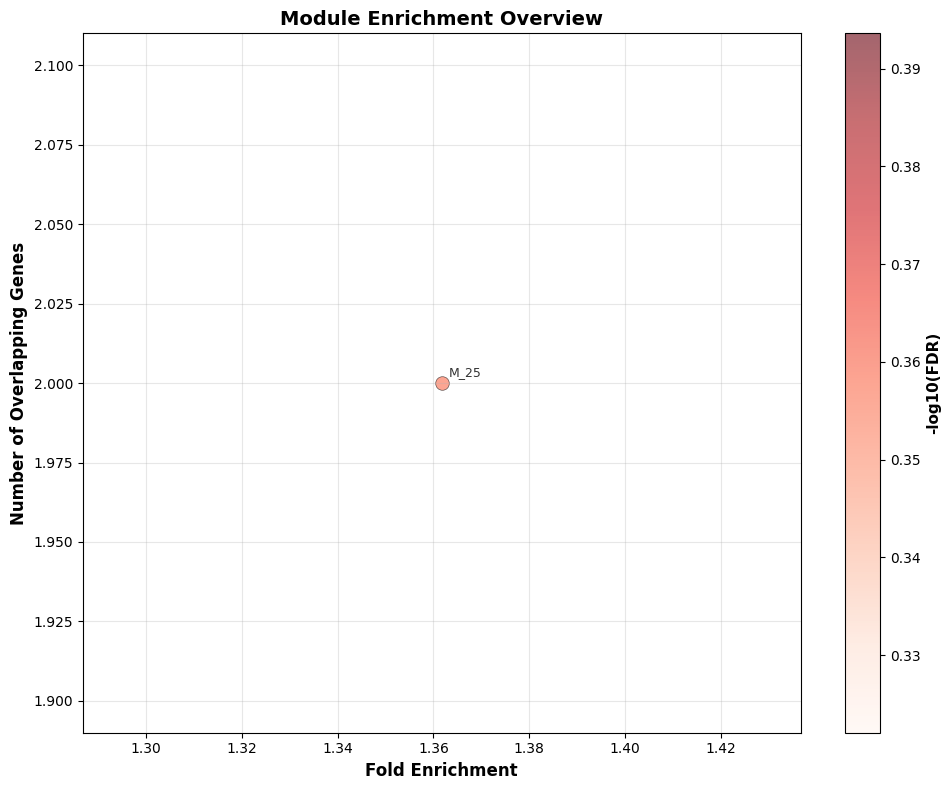


ANALYSIS COMPLETE


In [20]:
#!/usr/bin/env python3
"""
Module Enrichment Analysis for Niche Genes
Performs hypergeometric test to identify enriched metabolic modules
"""

import pandas as pd
import numpy as np
from scipy.stats import hypergeom
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ---------- INPUT ----------
NICHE_GENES_CSV = "niche_genes.csv"  # Output from previous script
MODULE_MAPPING_CSV = Path("../Data/fluxestimator/module_gene_complete_mouse_m168.csv")
OUTPUT_PREFIX = "niche_module_enrichment"
# ---------------------------

def load_module_mapping(csv_path):
    """Load module-to-gene mapping from CSV"""
    df = pd.read_csv(csv_path, header=None)
    
    module_dict = {}
    for _, row in df.iterrows():
        module_id = row[0]
        # Skip header row
        if module_id == '1':
            continue
        # Get all genes for this module (exclude first column which is module ID)
        genes = [str(g).strip() for g in row[1:] if pd.notna(g) and str(g).strip() != '']
        module_dict[module_id] = genes
    
    return module_dict

def hypergeometric_test(k, M, n, N):
    """
    Hypergeometric test for enrichment
    k: number of genes in both niche and module
    M: total number of genes in background
    n: number of genes in module
    N: number of genes in niche
    
    Returns p-value
    """
    pval = hypergeom.sf(k-1, M, n, N)
    return pval

def perform_enrichment_analysis(niche_genes, module_dict, background_genes):
    """Perform module enrichment analysis"""
    results = []
    
    niche_set = set([g.upper() for g in niche_genes])
    N = len(niche_set)
    M = len(background_genes)
    
    for module_id, module_genes in module_dict.items():
        module_set = set([g.upper() for g in module_genes])
        n = len(module_set)
        
        # Find overlap
        overlap = niche_set & module_set
        k = len(overlap)
        
        if k > 0:  # Only test modules with at least one hit
            pval = hypergeometric_test(k, M, n, N)
            
            # Calculate enrichment ratio
            expected = (n * N) / M
            fold_enrichment = k / expected if expected > 0 else 0
            
            results.append({
                'Module': module_id,
                'Module_Size': n,
                'Overlap': k,
                'Expected': expected,
                'Fold_Enrichment': fold_enrichment,
                'P_value': pval,
                'Overlapping_Genes': ', '.join(sorted(overlap))
            })
    
    # Convert to dataframe and add FDR correction
    results_df = pd.DataFrame(results)
    if not results_df.empty:
        results_df = results_df.sort_values('P_value')
        # Benjamini-Hochberg FDR correction
        results_df['FDR'] = results_df['P_value'] * len(results_df) / (np.arange(len(results_df)) + 1)
        results_df['FDR'] = results_df['FDR'].clip(upper=1.0)
    
    return results_df

def plot_enrichment_results(results_df, output_prefix, top_n=20):
    """Create visualizations of enrichment results"""
    
    if results_df.empty:
        print("No enriched modules found.")
        return
    
    # Get top enriched modules
    top_results = results_df.head(top_n).copy()
    top_results['-log10(FDR)'] = -np.log10(top_results['FDR'].clip(lower=1e-300))
    
    # Plot 1: Bar plot of -log10(FDR)
    fig, axes = plt.subplots(2, 1, figsize=(12, 10))
    
    # Top panel: -log10(FDR)
    ax1 = axes[0]
    bars = ax1.barh(range(len(top_results)), top_results['-log10(FDR)'])
    
    # Color bars by significance
    colors = ['darkred' if fdr < 0.01 else 'coral' if fdr < 0.05 else 'lightcoral' 
              for fdr in top_results['FDR']]
    for bar, color in zip(bars, colors):
        bar.set_color(color)
    
    ax1.set_yticks(range(len(top_results)))
    ax1.set_yticklabels(top_results['Module'])
    ax1.set_xlabel('-log10(FDR)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Module', fontsize=12, fontweight='bold')
    ax1.set_title('Top Enriched Modules in Niche Genes', fontsize=14, fontweight='bold')
    ax1.axvline(x=-np.log10(0.05), color='black', linestyle='--', linewidth=1, label='FDR=0.05')
    ax1.axvline(x=-np.log10(0.01), color='black', linestyle='--', linewidth=1.5, label='FDR=0.01')
    ax1.legend()
    ax1.grid(axis='x', alpha=0.3)
    
    # Bottom panel: Fold enrichment
    ax2 = axes[1]
    bars2 = ax2.barh(range(len(top_results)), top_results['Fold_Enrichment'])
    for bar, color in zip(bars2, colors):
        bar.set_color(color)
    
    ax2.set_yticks(range(len(top_results)))
    ax2.set_yticklabels(top_results['Module'])
    ax2.set_xlabel('Fold Enrichment', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Module', fontsize=12, fontweight='bold')
    ax2.set_title('Fold Enrichment of Top Modules', fontsize=14, fontweight='bold')
    ax2.axvline(x=1, color='gray', linestyle='--', linewidth=1)
    ax2.grid(axis='x', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f"{output_prefix}_barplot.png", dpi=300, bbox_inches='tight')
    print(f"✓ Saved {output_prefix}_barplot.png")
    plt.show()
    
    # Plot 2: Scatter plot - Overlap vs Fold Enrichment
    fig, ax = plt.subplots(figsize=(10, 8))
    
    scatter = ax.scatter(
        results_df['Fold_Enrichment'],
        results_df['Overlap'],
        s=results_df['Module_Size'] * 3,
        c=-np.log10(results_df['FDR'].clip(lower=1e-300)),
        cmap='Reds',
        alpha=0.6,
        edgecolors='black',
        linewidth=0.5
    )
    
    # Annotate top modules
    for _, row in top_results.head(10).iterrows():
        ax.annotate(
            row['Module'],
            (row['Fold_Enrichment'], row['Overlap']),
            fontsize=9,
            alpha=0.8,
            xytext=(5, 5),
            textcoords='offset points'
        )
    
    ax.set_xlabel('Fold Enrichment', fontsize=12, fontweight='bold')
    ax.set_ylabel('Number of Overlapping Genes', fontsize=12, fontweight='bold')
    ax.set_title('Module Enrichment Overview', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('-log10(FDR)', fontsize=11, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(f"{output_prefix}_scatter.png", dpi=300, bbox_inches='tight')
    print(f"✓ Saved {output_prefix}_scatter.png")
    plt.show()

def main():
    print("="*80)
    print("MODULE ENRICHMENT ANALYSIS FOR NICHE GENES")
    print("="*80 + "\n")
    
    # Load niche genes
    try:
        niche_df = pd.read_csv(NICHE_GENES_CSV)
        niche_genes = niche_df.iloc[:, 0].tolist()
        print(f"Loaded {len(niche_genes)} niche genes from {NICHE_GENES_CSV}")
    except FileNotFoundError:
        print(f"Error: {NICHE_GENES_CSV} not found. Run the main analysis first.")
        return
    
    # Load module mapping
    print(f"Loading module mapping from {MODULE_MAPPING_CSV}...")
    module_dict = load_module_mapping(MODULE_MAPPING_CSV)
    print(f"Loaded {len(module_dict)} modules")
    
    # Create background gene set (all genes in all modules)
    background_genes = set()
    for genes in module_dict.values():
        background_genes.update([g.upper() for g in genes])
    print(f"Background: {len(background_genes)} unique genes across all modules\n")
    
    # Perform enrichment analysis
    print("Performing enrichment analysis...")
    results_df = perform_enrichment_analysis(niche_genes, module_dict, background_genes)
    
    if results_df.empty:
        print("No overlapping genes found between niche genes and modules.")
        return
    
    # Print results
    print("\n" + "="*80)
    print("ENRICHMENT RESULTS")
    print("="*80 + "\n")
    
    significant = results_df[results_df['FDR'] < 0.05]
    print(f"Modules with FDR < 0.05: {len(significant)}/{len(results_df)}\n")
    
    print("Top 20 enriched modules:")
    print("-"*80)
    for i, row in results_df.head(20).iterrows():
        print(f"\n{row['Module']}")
        print(f"  Overlap: {row['Overlap']}/{row['Module_Size']} genes")
        print(f"  Fold Enrichment: {row['Fold_Enrichment']:.2f}x")
        print(f"  P-value: {row['P_value']:.2e}")
        print(f"  FDR: {row['FDR']:.2e}")
        print(f"  Genes: {row['Overlapping_Genes']}")
    
    # Save full results
    results_df.to_csv(f"{OUTPUT_PREFIX}_full_results.csv", index=False)
    print(f"\n✓ Saved {OUTPUT_PREFIX}_full_results.csv")
    
    # Save significant results
    if len(significant) > 0:
        significant.to_csv(f"{OUTPUT_PREFIX}_significant.csv", index=False)
        print(f"✓ Saved {OUTPUT_PREFIX}_significant.csv")
    
    # Create visualizations
    print("\nGenerating plots...")
    plot_enrichment_results(results_df, OUTPUT_PREFIX, top_n=20)
    
    print("\n" + "="*80)
    print("ANALYSIS COMPLETE")
    print("="*80)

if __name__ == "__main__":
    main()

Found 100 edges from specified genes

NICHE → FLUX CONNECTIONS FROM: GSTA4, GSTO1

Edges found:
  Gsto1           → Succinate                      : 0.8141
  Gsta4           → AICAR                          : 0.7770
  Gsto1           → Propanoyl-CoA                  : 0.7670
  Gsta4           → (GlcNAc)4 (Man)3 (Asn)1        : 0.7473
  Gsta4           → (Glc)3 (GlcNAc)2 (Man)9 (Asn)1 : 0.7364
  Gsto1           → AICAR                          : 0.6378
  Gsta4           → Aspartate                      : 0.6058
  Gsta4           → Leucine                        : 0.5606
  Gsto1           → Choline                        : 0.5375
  Gsta4           → CDP                            : 0.5349
  Gsta4           → Pyruvate                       : 0.5258
  Gsto1           → Citrate                        : 0.5257
  Gsta4           → Acetyl-CoA                     : 0.5229
  Gsto1           → Glutathione                    : 0.5173
  Gsta4           → Glycine                        : 0.5118
  Gs

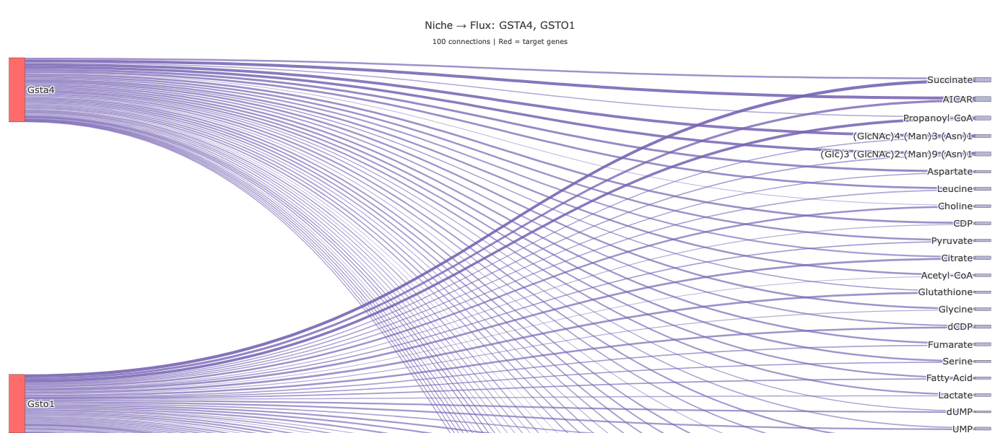

In [21]:
#!/usr/bin/env python3
"""
2-column Sankey: Niche → Flux (GSTA4 and GSTO1 only)
- Filters for connections from specific niche genes
- Rank-based color gradients for each column
"""

import pandas as pd
import numpy as np
import plotly.graph_objects as go
from matplotlib import cm, colors as mpl_colors
from pathlib import Path

# ---------- LAYOUT KNOBS ----------
WIDTH        = 900
HEIGHT       = 600
FONT_SIZE    = 13
NODE_THICK   = 22
NODE_PAD     = 20
V_SPREAD     = 0.88
# ----------------------------------

# ---------- USER INPUT ----------
CSV_NICHE_TO_FLUX = Path("../Mongoose_post_hoc/niche_to_flux_shap_edges_with_ranks_cluster0_20251207_201807.csv")

# Genes to filter for (as sources)
TARGET_NICHE_GENES = ["GSTA4", "GSTO1"]

CLUSTERS     = None
MIN_WEIGHT   = 0.0  # Include all connections for these genes
OUT_HTML     = "alluvial_gsta4_gsto1_to_flux.html"
SHOW_FIG     = True
# ---------------------------------

# ---------- helpers ----------
def to_hex(v01, cmap="Oranges"):
    rgba = cm.get_cmap(cmap)(float(np.clip(v01, 0, 1)))
    return mpl_colors.to_hex(rgba)

def side_colors(names, ranks, cmap, fallback_intensity=0.4):
    arr = np.array(ranks, dtype=float)
    finite = np.isfinite(arr)
    if finite.any():
        rmin, rmax = np.nanmin(arr[finite]), np.nanmax(arr[finite])
        span = (rmax - rmin) if rmax != rmin else 1.0
        v01  = np.where(finite, (rmax - arr) / span, np.nan)  # best→1
        v01  = np.nan_to_num(v01, nan=0.15)
        v01  = 0.15 + 0.85 * v01
    else:
        v01 = np.full(len(names), fallback_intensity)
    return [to_hex(v, cmap) for v in v01], v01

def order_by_rank(names, best_series):
    recs = [(n, best_series.get(n, np.inf)) for n in names]
    recs.sort(key=lambda t: (not np.isfinite(t[1]), t[1]))  # NaNs last
    ordered_names  = [n for n, _ in recs]
    ordered_ranks  = [r if np.isfinite(r) else np.nan for _, r in recs]
    return ordered_names, ordered_ranks

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster":"cluster","Source":"source","Target":"target","Value":"value","Direction":"direction",
        "Niche_rank":"niche_rank","Activity_rank":"activity_rank","Flux_rank":"flux_rank"
    })

def _local_y_positions(n, v_spread=0.88):
    if n <= 1: return [0.5]
    top    = (1.0 - v_spread) / 2.0
    bottom = 1.0 - top
    return np.linspace(top, bottom, n).tolist()

def load_and_filter_genes(csv_path, target_genes, clusters=None, min_weight=0.0):
    """Load CSV and filter for specific source genes"""
    df = pd.read_csv(csv_path)
    df = _normalize_columns(df)
    
    if clusters is not None and "cluster" in df.columns:
        df = df[df["cluster"].isin(clusters)].copy()
    
    for c in ["value","niche_rank","activity_rank","flux_rank"]:
        if c in df.columns: 
            df[c] = pd.to_numeric(df[c], errors="coerce")
    
    df = df.dropna(subset=["source","target","value"])
    
    # Create uppercase set of target genes for matching
    target_set = {g.upper() for g in target_genes}
    
    # Filter for edges where source is in target genes
    mask = df["source"].astype(str).str.upper().isin(target_set)
    
    df_filtered = df[mask].copy()
    
    print(f"Found {len(df_filtered)} edges from specified genes")
    
    edges = (df_filtered.groupby(["source","target"], as_index=False)["value"].sum()
               .sort_values("value", ascending=False))
    edges = edges[edges["value"] >= min_weight]
    
    return edges, df_filtered

# ---------- main ----------
def main():
    # Load CSV and filter for target genes
    edges, df = load_and_filter_genes(CSV_NICHE_TO_FLUX, TARGET_NICHE_GENES, CLUSTERS, MIN_WEIGHT)
    
    if edges.empty:
        raise SystemExit(f"No edges from specified genes: {TARGET_NICHE_GENES}")
    
    # Print connection summary
    print(f"\n{'='*70}")
    print(f"NICHE → FLUX CONNECTIONS FROM: {', '.join(TARGET_NICHE_GENES)}")
    print(f"{'='*70}")
    print(f"\nEdges found:")
    for _, row in edges.iterrows():
        print(f"  {row['source']:<15} → {row['target']:<30} : {row['value']:.4f}")
    print(f"\nTotal edges: {len(edges)}")
    print(f"{'='*70}\n")
    
    # Extract unique nodes for each column
    niche_nodes = edges["source"].astype(str).unique()
    flux_nodes = edges["target"].astype(str).unique()
    
    # Get ranks for ordering and coloring
    niche_ranks = df.groupby("source")["niche_rank"].min() if "niche_rank" in df.columns else pd.Series(dtype=float)
    flux_ranks = df.groupby("target")["flux_rank"].min() if "flux_rank" in df.columns else pd.Series(dtype=float)
    
    # Order nodes by rank
    if len(niche_ranks) > 0:
        ordered_niche, niche_rank_vals = order_by_rank(niche_nodes, niche_ranks)
    else:
        ordered_niche, niche_rank_vals = list(niche_nodes), [np.nan]*len(niche_nodes)
        
    if len(flux_ranks) > 0:
        ordered_flux, flux_rank_vals = order_by_rank(flux_nodes, flux_ranks)
    else:
        ordered_flux, flux_rank_vals = list(flux_nodes), [np.nan]*len(flux_nodes)
    
    # Generate colors - highlight target genes in red
    niche_colors, _ = side_colors(ordered_niche, niche_rank_vals, "Greens")
    flux_colors, _ = side_colors(ordered_flux, flux_rank_vals, "Purples")
    
    # Highlight target genes in red
    target_set = {g.upper() for g in TARGET_NICHE_GENES}
    for i, node in enumerate(ordered_niche):
        if node.upper() in target_set:
            niche_colors[i] = "#FF6B6B"  # Red highlight
    
    # Combine all nodes
    all_nodes = ordered_niche + ordered_flux
    all_colors = niche_colors + flux_colors
    node_idx = {n: i for i, n in enumerate(all_nodes)}
    
    # Calculate positions
    n_niche = len(ordered_niche)
    n_flux = len(ordered_flux)
    
    y_niche = _local_y_positions(n_niche, V_SPREAD)
    y_flux = _local_y_positions(n_flux, V_SPREAD)
    
    # X positions for two columns
    x_positions = (
        [0.01] * n_niche +        # Column 1: Niche (left)
        [0.99] * n_flux           # Column 2: Flux (right)
    )
    
    y_positions = y_niche + y_flux
    
    # Build links
    links_source = []
    links_target = []
    links_value = []
    
    # Links from Niche → Flux
    for _, row in edges.iterrows():
        src = str(row["source"])
        tgt = str(row["target"])
        if src in node_idx and tgt in node_idx:
            links_source.append(node_idx[src])
            links_target.append(node_idx[tgt])
            links_value.append(float(row["value"]))
    
    # Color links based on edge strength - use gradient
    max_val = max(links_value) if links_value else 1
    min_val = min(links_value) if links_value else 0
    val_range = max_val - min_val if max_val != min_val else 1
    
    link_colors = []
    for val in links_value:
        # Normalize value to 0-1
        norm_val = (val - min_val) / val_range
        # Use gradient from light to dark blue-purple
        opacity = 0.4 + 0.5 * norm_val  # 0.4 to 0.9 opacity
        link_colors.append(f"rgba(120, 100, 180, {opacity})")
    
    # Create Sankey
    fig = go.Figure(data=[go.Sankey(
        arrangement="snap",
        node=dict(
            pad=NODE_PAD,
            thickness=NODE_THICK,
            line=dict(color="black", width=0.3),
            label=all_nodes,
            color=all_colors,
            x=x_positions,
            y=y_positions,
            hovertemplate="%{label}<extra></extra>",
        ),
        link=dict(
            source=links_source,
            target=links_target,
            value=links_value,
            color=link_colors,
            line=dict(width=0),
            hovertemplate="Source: %{source.label}<br>Target: %{target.label}<br>SHAP: %{value:.4f}<extra></extra>",
        )
    )])
    
    fig.update_layout(
        title=dict(
            text=f"Niche → Flux: {', '.join(TARGET_NICHE_GENES)}<br><sub>{len(edges)} connections | Red = target genes</sub>",
            font=dict(size=14)
        ),
        font=dict(size=FONT_SIZE),
        height=HEIGHT, 
        width=WIDTH,
        margin=dict(l=10, r=10, t=80, b=10),
        template="none",
        paper_bgcolor="rgba(0,0,0,0)",
        plot_bgcolor="rgba(0,0,0,0)",
    )
    
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)
    
    fig.write_html(OUT_HTML, include_plotlyjs="cdn")
    print(f"✓ Saved {OUT_HTML}")
    print(f"  Nodes: {n_niche} Niche → {n_flux} Flux")
    print(f"  Links: {len(links_source)} total edges\n")
    
    # Export gene/flux lists
    niche_genes = sorted(list(niche_nodes))
    flux_metabolites = sorted(list(flux_nodes))
    
    print("="*70)
    print("GENE/FLUX LISTS")
    print("="*70)
    
    print(f"\nNICHE GENES: {len(niche_genes)}")
    print("-"*70)
    for gene in niche_genes:
        print(gene)
    
    print(f"\n{'='*70}")
    print(f"FLUX METABOLITES: {len(flux_metabolites)}")
    print("-"*70)
    for flux in flux_metabolites:
        print(flux)
    print("="*70 + "\n")
    
    # Export to CSV
    pd.DataFrame({"Niche_Gene": niche_genes}).to_csv(
        "gsta4_gsto1_niche_genes.csv", index=False
    )
    pd.DataFrame({"Flux_Metabolite": flux_metabolites}).to_csv(
        "gsta4_gsto1_flux_metabolites.csv", index=False
    )
    print("✓ Saved gsta4_gsto1_niche_genes.csv")
    print("✓ Saved gsta4_gsto1_flux_metabolites.csv\n")
    
    if SHOW_FIG:
        fig.show()

if __name__ == "__main__":
    main()

Filtered SHAP edges: 801
Unique SHAP connections (activity→niche): 782
Activity genes (after suffix removal): 36
Niche genes: 33
Total unique genes for STRING: 69

Querying STRING database...
STRING IDs found: 61

Performing pathway enrichment...

Top 10 Enriched Pathways:
1. Extracellular space (FDR: 7.39e-08)
2. Secreted (FDR: 7.82e-07)
3. Extracellular region (FDR: 1.04e-05)
4. Disulfide bond (FDR: 7.85e-05)
5. Glycoprotein (FDR: 7.85e-05)
6. Repeat (FDR: 9.17e-05)
7. Signal (FDR: 1.60e-04)
8. Extracellular region (FDR: 1.70e-04)
9. (2013) The link between chronic periodontitis and COPD: a common role for the neutrophil? (FDR: 3.70e-04)
10. (2021) An integrated multiomic and quantitative label-free microscopy-based approach to study pro-fibrotic signalling in ex vivo human precision-cut lung slices. (FDR: 3.70e-04)

Fetching STRING network (score threshold: 400)...
Total STRING edges: 40


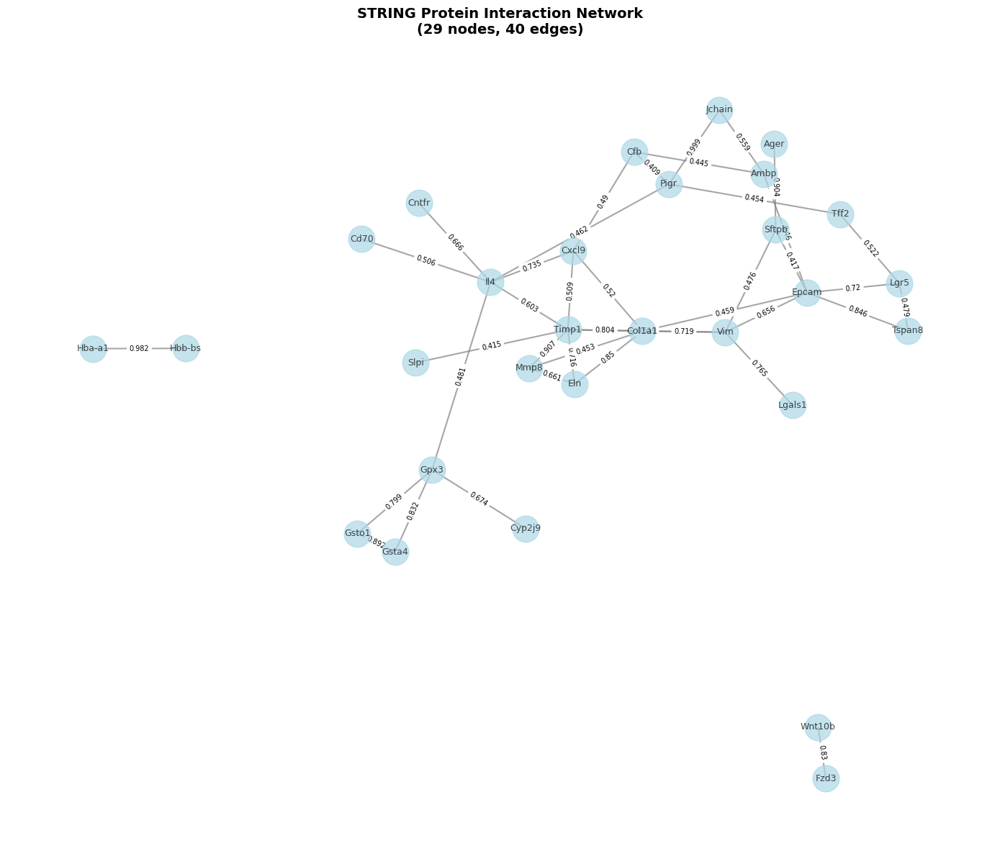


Activity–Niche STRING connections: 11

✨ Connections in BOTH SHAP and STRING: 10/11

SHAP VALUES FOR CONNECTIONS

CONNECTIONS IN BOTH SHAP AND STRING (10 total)
Source               Target                 SHAP Value   STRING Score
--------------------------------------------------------------------------------
Cyp2j9               Gpx3                       0.6378            0.7
Il4                  Gpx3                       0.4501            0.5
Mmp8                 Eln                        0.3075            0.7
Il4                  Timp1                      0.3030            0.6
Mmp8                 Timp1                      0.2985            0.9
Il4                  Cxcl9                      0.2685            0.7
Lgr5                 Epcam                      0.2536            0.7
Il4                  Pigr                       0.2093            0.5
Mmp8                 Col1a1                     0.1340            0.5
Lgr5                 Tspan8                     0.1317   

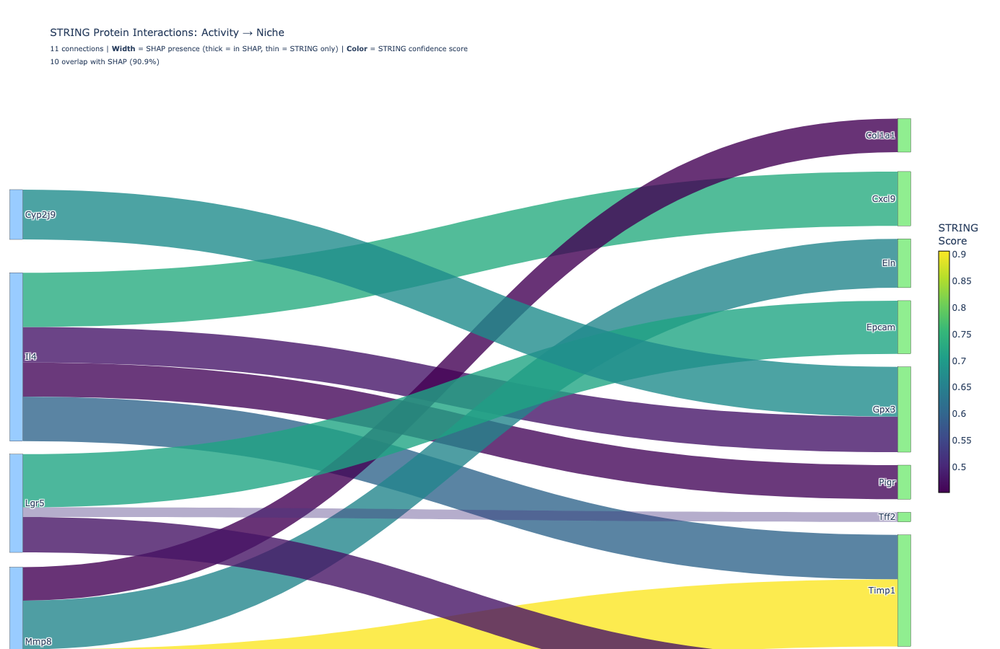

✓ Saved string_activity_niche_edges_with_shap.csv
✓ Saved string_shap_overlap_with_values.csv
✓ Saved string_pathway_enrichment.csv

SUMMARY STATISTICS
Activity genes: 36
Niche genes: 33
SHAP connections: 782
Total STRING edges: 40
Activity-Niche STRING connections: 11
✨ Overlap (SHAP + STRING): 10 (90.9%)
STRING-only connections: 1


In [13]:
#!/usr/bin/env python3
"""
STRING DB Network Analysis for Activity → Niche Genes
Width = SHAP presence, Color = STRING score
Prints SHAP values for all connections
"""

import pandas as pd
import numpy as np
import stringdb
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from pathlib import Path

# ---------- INPUT ----------
CSV2 = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")
MIN_WEIGHT = 0.1
TOP_N_EDGES = None
CLUSTERS = None
STRING_SPECIES = 10090  # Mouse (human = 9606)
STRING_SCORE_THRESHOLD = 400
# ---------------------------

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster":"cluster","Source":"source","Target":"target","Value":"value",
        "Niche_rank":"niche_rank","Activity_rank":"activity_rank"
    })

def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from activity genes"""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene

# ============================================================
# 1. LOAD CSV2 AND EXTRACT GENES + SHAP EDGES
# ============================================================

df = pd.read_csv(CSV2)
df = _normalize_columns(df)

if CLUSTERS is not None and "cluster" in df.columns:
    df = df[df["cluster"].isin(CLUSTERS)].copy()

for c in ["value","niche_rank","activity_rank"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

df = df.dropna(subset=["source","target","value"])

# Filter edges
edges = (df.groupby(["source","target"], as_index=False)["value"].sum()
           .sort_values("value", ascending=False))
edges = edges[edges["value"] >= MIN_WEIGHT]
if TOP_N_EDGES:
    edges = edges.head(TOP_N_EDGES)

print(f"Filtered SHAP edges: {len(edges)}")

# Create SHAP edge dictionary with values (with suffixes removed from activity genes)
shap_edges_dict = {}
for _, row in edges.iterrows():
    source_clean = remove_suffix(str(row["source"])).upper()
    target_clean = str(row["target"]).upper()
    shap_edges_dict[(source_clean, target_clean)] = row["value"]

print(f"Unique SHAP connections (activity→niche): {len(shap_edges_dict)}")

# Extract unique genes
activity_genes_raw = edges["source"].astype(str).unique()
niche_genes = edges["target"].astype(str).unique()

# Remove suffixes from activity genes
activity_genes = [remove_suffix(g) for g in activity_genes_raw]
activity_genes = list(set(activity_genes))  # Remove duplicates after suffix removal

print(f"Activity genes (after suffix removal): {len(activity_genes)}")
print(f"Niche genes: {len(niche_genes)}")

# Combine all genes for STRING query
all_genes = sorted(list(set(activity_genes) | set(niche_genes)))
print(f"Total unique genes for STRING: {len(all_genes)}")

# Create sets for filtering (uppercase)
activity_set = {g.upper() for g in activity_genes}
niche_set = {g.upper() for g in niche_genes}


# ============================================================
# 2. QUERY STRING DATABASE
# ============================================================

print("\nQuerying STRING database...")
string_ids = stringdb.get_string_ids(all_genes, species=STRING_SPECIES)
print(f"STRING IDs found: {len(string_ids)}")

# Get enrichment (optional)
print("\nPerforming pathway enrichment...")
enrichment_df = stringdb.get_enrichment(string_ids.queryItem, species=STRING_SPECIES)
sorted_enrichment = enrichment_df.sort_values(by='fdr', ascending=True)
top_10_pathways = sorted_enrichment['description'].head(10)

print("\nTop 10 Enriched Pathways:")
for i, pathway in enumerate(top_10_pathways, 1):
    fdr = sorted_enrichment.iloc[i-1]['fdr']
    print(f"{i}. {pathway} (FDR: {fdr:.2e})")

# Get protein-protein interaction network
print(f"\nFetching STRING network (score threshold: {STRING_SCORE_THRESHOLD})...")
network_df = stringdb.get_network(
    string_ids.queryItem, 
    species=STRING_SPECIES, 
    required_score=STRING_SCORE_THRESHOLD
)
print(f"Total STRING edges: {len(network_df)}")


# ============================================================
# 3. VISUALIZE FULL NETWORK (NetworkX) - NO GRID
# ============================================================

G = nx.Graph()
for index, row in network_df.iterrows():
    G.add_edge(row['preferredName_A'], row['preferredName_B'], weight=row['score'])

pos = nx.spring_layout(G, k=1.2, iterations=250, seed=42)

fig_nx, ax = plt.subplots(figsize=(14, 12))
nx.draw(
    G, pos,
    with_labels=True,
    node_size=700,
    node_color='lightblue',
    font_size=9,
    edge_color="gray",
    width=1.5,
    alpha=0.7,
    ax=ax
)

edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7, ax=ax)

ax.set_title(f"STRING Protein Interaction Network\n({len(G.nodes())} nodes, {len(G.edges())} edges)", 
             fontsize=14, fontweight='bold')
ax.axis('off')  # Remove axes
plt.tight_layout()
plt.savefig("string_network_full.png", dpi=150, bbox_inches='tight')
plt.show()


# ============================================================
# 4. FILTER ACTIVITY–NICHE EDGES (UNDIRECTED)
# ============================================================

edge_df = network_df.rename(columns={
    "preferredName_A": "gene1",
    "preferredName_B": "gene2",
    "score": "edge_weight"
}).copy()

edge_df["g1"] = edge_df["gene1"].str.upper()
edge_df["g2"] = edge_df["gene2"].str.upper()

# Filter for edges connecting Activity and Niche genes
filtered_edges = edge_df[
    ((edge_df["g1"].isin(activity_set)) & (edge_df["g2"].isin(niche_set))) |
    ((edge_df["g1"].isin(niche_set)) & (edge_df["g2"].isin(activity_set)))
].copy()

print(f"\nActivity–Niche STRING connections: {len(filtered_edges)}")


# ============================================================
# 5. FORCE SANKEY DIRECTION: ACTIVITY (LEFT) → NICHE (RIGHT)
# ============================================================

def assign_direction(row):
    """Ensure Activity genes are on the left, Niche on the right"""
    if row["g1"] in activity_set and row["g2"] in niche_set:
        return pd.Series([row["gene1"], row["gene2"]])
    else:
        return pd.Series([row["gene2"], row["gene1"]])

filtered_edges[["source_sankey", "target_sankey"]] = filtered_edges.apply(
    assign_direction, axis=1
)


# ============================================================
# 6. IDENTIFY OVERLAPPING CONNECTIONS + GET SHAP VALUES
# ============================================================

# Check which STRING edges also exist in SHAP and get SHAP values
def get_shap_value(row):
    key = (row["source_sankey"].upper(), row["target_sankey"].upper())
    return shap_edges_dict.get(key, np.nan)

filtered_edges["shap_value"] = filtered_edges.apply(get_shap_value, axis=1)
filtered_edges["in_shap"] = ~filtered_edges["shap_value"].isna()

overlap_count = filtered_edges["in_shap"].sum()
print(f"\n✨ Connections in BOTH SHAP and STRING: {overlap_count}/{len(filtered_edges)}")


# ============================================================
# 7. PRINT SHAP VALUES TABLE
# ============================================================

print("\n" + "="*80)
print("SHAP VALUES FOR CONNECTIONS")
print("="*80)

# Sort by SHAP value (descending) for overlap connections
overlap_df = filtered_edges[filtered_edges["in_shap"]].copy()
overlap_df = overlap_df.sort_values("shap_value", ascending=False)

if len(overlap_df) > 0:
    print(f"\n{'='*80}")
    print(f"CONNECTIONS IN BOTH SHAP AND STRING ({len(overlap_df)} total)")
    print(f"{'='*80}")
    print(f"{'Source':<20} {'Target':<20} {'SHAP Value':>12} {'STRING Score':>14}")
    print("-"*80)
    
    for _, row in overlap_df.iterrows():
        print(f"{row['source_sankey']:<20} {row['target_sankey']:<20} "
              f"{row['shap_value']:12.4f} {row['edge_weight']:14.1f}")
    
    print("-"*80)
    print(f"Mean SHAP value: {overlap_df['shap_value'].mean():.4f}")
    print(f"Mean STRING score: {overlap_df['edge_weight'].mean():.1f}")
    print()

# STRING-only connections
string_only_df = filtered_edges[~filtered_edges["in_shap"]].copy()
string_only_df = string_only_df.sort_values("edge_weight", ascending=False)

if len(string_only_df) > 0:
    print(f"\n{'='*80}")
    print(f"STRING-ONLY CONNECTIONS (not in SHAP) ({len(string_only_df)} total)")
    print(f"{'='*80}")
    print(f"{'Source':<20} {'Target':<20} {'STRING Score':>14}")
    print("-"*80)
    
    for _, row in string_only_df.head(20).iterrows():  # Show top 20
        print(f"{row['source_sankey']:<20} {row['target_sankey']:<20} "
              f"{row['edge_weight']:14.1f}")
    
    if len(string_only_df) > 20:
        print(f"... and {len(string_only_df) - 20} more")
    
    print("-"*80)
    print(f"Mean STRING score: {string_only_df['edge_weight'].mean():.1f}")
    print()


# ============================================================
# 8. BUILD SANKEY NODE ORDERING
# ============================================================

activity_nodes_sankey = sorted(list(filtered_edges["source_sankey"].unique()))
niche_nodes_sankey = sorted(list(filtered_edges["target_sankey"].unique()))

nodes = activity_nodes_sankey + niche_nodes_sankey
node_index = {name: i for i, name in enumerate(nodes)}

print(f"Sankey nodes: {len(activity_nodes_sankey)} Activity → {len(niche_nodes_sankey)} Niche")


# ============================================================
# 9. BUILD SANKEY LINK DATA WITH WIDTH + COLOR ENCODING
# ============================================================

link_sources = filtered_edges["source_sankey"].map(node_index).tolist()
link_targets = filtered_edges["target_sankey"].map(node_index).tolist()
link_values = filtered_edges["edge_weight"].tolist()

# COLOR: Based on STRING score (using viridis colormap)
# Normalize STRING scores to 0-1 range
min_score = min(link_values)
max_score = max(link_values)
score_range = max_score - min_score if max_score != min_score else 1

link_colors = []
for _, row in filtered_edges.iterrows():
    score_norm = (row["edge_weight"] - min_score) / score_range
    # Use viridis colormap: purple (low) -> green/yellow (high)
    cmap = cm.get_cmap("viridis")
    rgba = cmap(score_norm)
    # Add opacity: higher for SHAP overlap, lower for STRING-only
    alpha = 0.8 if row["in_shap"] else 0.4
    link_colors.append(f"rgba({int(rgba[0]*255)}, {int(rgba[1]*255)}, {int(rgba[2]*255)}, {alpha})")

# Width encoding
link_visual_values = []
for _, row in filtered_edges.iterrows():
    if row["in_shap"]:
        # SHAP connections: 2x wider
        link_visual_values.append(row["edge_weight"] * 2.0)
    else:
        # STRING-only: 0.5x thinner
        link_visual_values.append(row["edge_weight"] * 0.5)

# Create hover labels
link_labels = []
for _, row in filtered_edges.iterrows():
    if row["in_shap"]:
        overlap_info = f"✓ IN SHAP (value: {row['shap_value']:.4f})"
    else:
        overlap_info = "STRING only"
    link_labels.append(
        f"{row['source_sankey']} → {row['target_sankey']}<br>"
        f"STRING score: {row['edge_weight']}<br>"
        f"{overlap_info}"
    )


# ============================================================
# 10. CREATE SANKEY FIGURE - NO GRID
# ============================================================

fig = go.Figure(data=[go.Sankey(
    arrangement="snap",
    orientation="h",
    
    node=dict(
        label=nodes,
        pad=18,
        thickness=18,
        x=[0.01]*len(activity_nodes_sankey) + [0.99]*len(niche_nodes_sankey),
        y=list(pd.Series(range(len(activity_nodes_sankey))).rank(pct=True)) +
          list(pd.Series(range(len(niche_nodes_sankey))).rank(pct=True)),
        color=["#99ccff"]*len(activity_nodes_sankey) + ["#90EE90"]*len(niche_nodes_sankey),
        line=dict(color="black", width=0.3)
    ),
    
    link=dict(
        source=link_sources,
        target=link_targets,
        value=link_visual_values,  # This controls visual width
        color=link_colors,          # This shows STRING score
        hovertemplate="<b>%{label}</b><extra></extra>",
        label=link_labels
    )
)])

# Add a colorbar to show STRING score scale
fig.add_trace(go.Scatter(
    x=[None], 
    y=[None],
    mode='markers',
    marker=dict(
        size=0.1,
        color=[min_score, max_score],
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(
            title="STRING<br>Score",
            x=1.02,
            xanchor="left",
            len=0.5,
            thickness=15,
            outlinewidth=1,
            outlinecolor="black"
        )
    ),
    showlegend=False,
    hoverinfo='skip'
))

fig.update_layout(
    title=dict(
        text=(
            f"STRING Protein Interactions: Activity → Niche<br>"
            f"<sub>{len(filtered_edges)} connections | "
            f"<b>Width</b> = SHAP presence (thick = in SHAP, thin = STRING only) | "
            f"<b>Color</b> = STRING confidence score</sub><br>"
            f"<sub>{overlap_count} overlap with SHAP ({100*overlap_count/len(filtered_edges):.1f}%)</sub>"
        ),
        font=dict(size=14)
    ),
    width=1500,
    height=900,
    font=dict(size=12),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    margin=dict(l=10, r=120, t=100, b=10),
    xaxis=dict(visible=False, showgrid=False),
    yaxis=dict(visible=False, showgrid=False)
)

fig.write_html("string_sankey_width_color_encoded.html")
print("\n✓ Saved string_sankey_width_color_encoded.html")
fig.show()


# ============================================================
# 11. EXPORT RESULTS WITH SHAP VALUES
# ============================================================

# Export filtered edges with SHAP values
filtered_edges.to_csv("string_activity_niche_edges_with_shap.csv", index=False)
print("✓ Saved string_activity_niche_edges_with_shap.csv")

# Export only overlapping edges with both values
overlap_df.to_csv("string_shap_overlap_with_values.csv", index=False)
print("✓ Saved string_shap_overlap_with_values.csv")

# Export enrichment results
sorted_enrichment.to_csv("string_pathway_enrichment.csv", index=False)
print("✓ Saved string_pathway_enrichment.csv")

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(f"Activity genes: {len(activity_genes)}")
print(f"Niche genes: {len(niche_genes)}")
print(f"SHAP connections: {len(shap_edges_dict)}")
print(f"Total STRING edges: {len(network_df)}")
print(f"Activity-Niche STRING connections: {len(filtered_edges)}")
print(f"✨ Overlap (SHAP + STRING): {overlap_count} ({100*overlap_count/len(filtered_edges):.1f}%)")
print(f"STRING-only connections: {len(string_only_df)}")
print("="*80)

This is the Gli3 regulon as found by Chea3 when providing all the genes that we got from the original alluvial

Filtered SHAP edges: 801


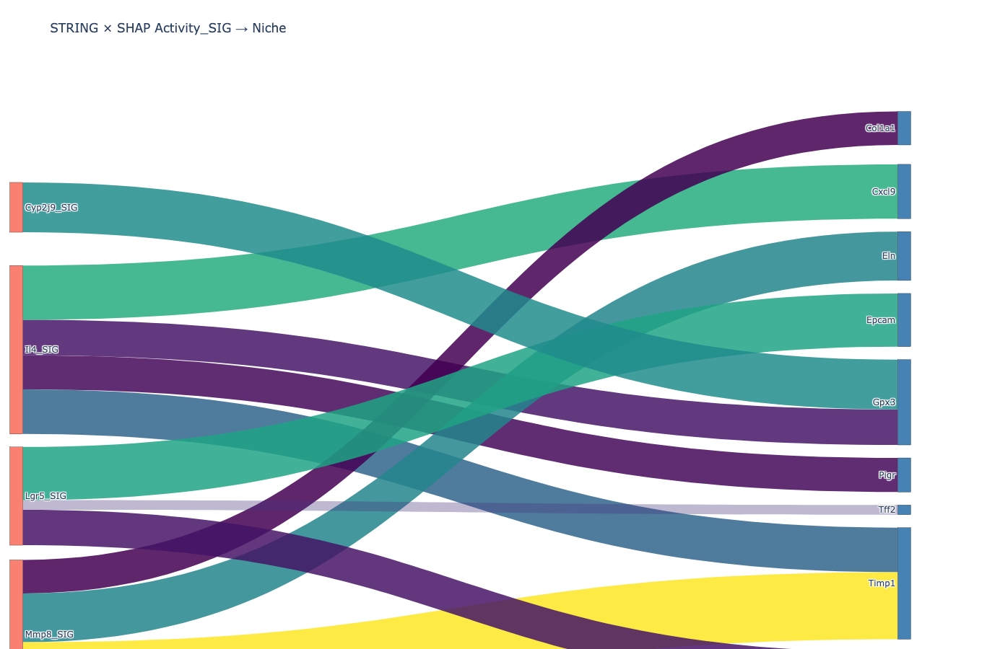


✓ DONE — Sankey exported with transparent background + colored nodes + _SIG sources


In [27]:
#!/usr/bin/env python3
"""
STRING DB Network Analysis for Activity → Niche Genes
Width = SHAP presence, Color = STRING score
Sankey: Activity nodes recolored + suffixed with _SIG
"""

import pandas as pd
import numpy as np
import stringdb
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.cm as cm
from pathlib import Path

# ---------- INPUT ----------
CSV2 = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")
MIN_WEIGHT = 0.1
TOP_N_EDGES = None
CLUSTERS = None
STRING_SPECIES = 10090  # Mouse
STRING_SCORE_THRESHOLD = 400
# ---------------------------

palette = {"NICHE": "steelblue", "ACTIVITY": "salmon"}

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster":"cluster","Source":"source","Target":"target","Value":"value",
        "Niche_rank":"niche_rank","Activity_rank":"activity_rank"
    })

def remove_suffix(gene_name):
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene


# ============================================================
# 1. LOAD CSV2 AND EXTRACT GENES + SHAP EDGES
# ============================================================

df = pd.read_csv(CSV2)
df = _normalize_columns(df)

if CLUSTERS is not None and "cluster" in df.columns:
    df = df[df["cluster"].isin(CLUSTERS)].copy()

for c in ["value","niche_rank","activity_rank"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

df = df.dropna(subset=["source","target","value"])

edges = (
    df.groupby(["source","target"], as_index=False)["value"].sum()
      .sort_values("value", ascending=False)
)
edges = edges[edges["value"] >= MIN_WEIGHT]

print(f"Filtered SHAP edges: {len(edges)}")

shap_edges_dict = {}
for _, row in edges.iterrows():
    s = remove_suffix(str(row["source"])).upper()
    t = str(row["target"]).upper()
    shap_edges_dict[(s, t)] = row["value"]

activity_genes = sorted({remove_suffix(x) for x in edges["source"]})
niche_genes = sorted(edges["target"].unique())

all_genes = sorted(set(activity_genes) | set(niche_genes))

activity_set = {g.upper() for g in activity_genes}
niche_set = {g.upper() for g in niche_genes}


# ============================================================
# 2. QUERY STRING
# ============================================================

string_ids = stringdb.get_string_ids(all_genes, species=STRING_SPECIES)
network_df = stringdb.get_network(
    string_ids.queryItem,
    species=STRING_SPECIES,
    required_score=STRING_SCORE_THRESHOLD
)

df_net = network_df.rename(columns={
    "preferredName_A":"gene1",
    "preferredName_B":"gene2",
    "score":"edge_weight"
})

df_net["g1"] = df_net["gene1"].str.upper()
df_net["g2"] = df_net["gene2"].str.upper()

filtered_edges = df_net[
    ((df_net["g1"].isin(activity_set)) & (df_net["g2"].isin(niche_set))) |
    ((df_net["g1"].isin(niche_set)) & (df_net["g2"].isin(activity_set)))
].copy()


# ============================================================
# 3. FORCE DIRECTION ACTIVITY → NICHE
# ============================================================

def assign_direction(r):
    if r["g1"] in activity_set and r["g2"] in niche_set:
        return pd.Series([r["gene1"], r["gene2"]])
    else:
        return pd.Series([r["gene2"], r["gene1"]])

filtered_edges[["source_sankey","target_sankey"]] = \
    filtered_edges.apply(assign_direction, axis=1)


# ============================================================
# 4. SHAP OVERLAP
# ============================================================

def get_shap_val(r):
    key = (r["source_sankey"].upper(), r["target_sankey"].upper())
    return shap_edges_dict.get(key, np.nan)

filtered_edges["shap_value"] = filtered_edges.apply(get_shap_val, axis=1)
filtered_edges["in_shap"] = ~filtered_edges["shap_value"].isna()


# ============================================================
# 5. SANKEY NODES WITH _SIG FOR ACTIVITY
# ============================================================

activity_nodes_sankey = sorted({
    x + "_SIG" for x in filtered_edges["source_sankey"].unique()
})
niche_nodes_sankey = sorted(filtered_edges["target_sankey"].unique())

nodes = activity_nodes_sankey + niche_nodes_sankey
node_index = {name: i for i, name in enumerate(nodes)}

node_colors = (
    [palette["ACTIVITY"]] * len(activity_nodes_sankey)
    + [palette["NICHE"]] * len(niche_nodes_sankey)
)


# ============================================================
# 6. SANKEY LINKS
# ============================================================

filtered_edges["source_vis"] = filtered_edges["source_sankey"] + "_SIG"
filtered_edges["target_vis"] = filtered_edges["target_sankey"]

link_sources = filtered_edges["source_vis"].map(node_index).tolist()
link_targets = filtered_edges["target_vis"].map(node_index).tolist()

scores = filtered_edges["edge_weight"].tolist()
mn, mx = min(scores), max(scores)
rng = mx - mn if mx != mn else 1

link_colors = []
for _, r in filtered_edges.iterrows():
    score_norm = (r["edge_weight"] - mn) / rng
    r_, g_, b_, _ = cm.viridis(score_norm)
    alpha = 0.85 if r["in_shap"] else 0.35
    link_colors.append(f"rgba({int(r_*255)}, {int(g_*255)}, {int(b_*255)}, {alpha})")

# Width
link_widths = [
    r["edge_weight"] * (2.0 if r["in_shap"] else 0.5)
    for _, r in filtered_edges.iterrows()
]

# Hover text
link_labels = []
for _, r in filtered_edges.iterrows():
    info = "✓ IN SHAP" if r["in_shap"] else "STRING only"
    link_labels.append(
        f"{r['source_vis']} → {r['target_vis']}<br>"
        f"STRING score: {r['edge_weight']}<br>{info}"
    )


# ============================================================
# 7. PLOT SANKEY
# ============================================================

fig = go.Figure(data=[go.Sankey(
    arrangement="snap",

    node=dict(
        label=nodes,
        pad=18,
        thickness=18,
        x=[0.01]*len(activity_nodes_sankey) + [0.99]*len(niche_nodes_sankey),
        y=list(pd.Series(range(len(activity_nodes_sankey))).rank(pct=True)) +
          list(pd.Series(range(len(niche_nodes_sankey))).rank(pct=True)),
        color=node_colors,
        line=dict(color="black", width=0.3)
    ),

    link=dict(
        source=link_sources,
        target=link_targets,
        value=link_widths,
        color=link_colors,
        label=link_labels,
        hovertemplate="%{label}<extra></extra>"
    )
)])

fig.update_layout(
    title="STRING × SHAP Activity_SIG → Niche",
    width=1500,
    height=900,
    font=dict(size=12),
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    margin=dict(l=10, r=120, t=90, b=20)
)

fig.write_html("string_sankey_width_color_encoded.html")
fig.show()


# ============================================================
# 8. EXPORT
# ============================================================

filtered_edges.to_csv("string_activity_niche_edges_with_shap.csv", index=False)
filtered_edges[filtered_edges["in_shap"]].to_csv("string_shap_overlap_with_values.csv", index=False)

print("\n✓ DONE — Sankey exported with transparent background + colored nodes + _SIG sources")


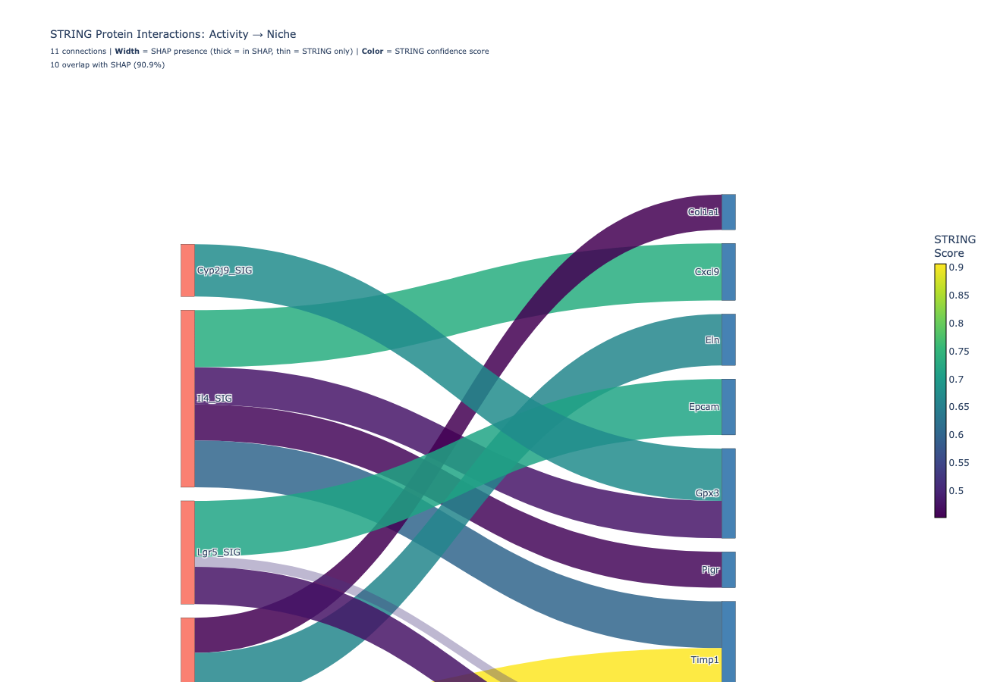

Filtered SHAP edges (Activity→Niche): 801
Unique SHAP connections (Activity→Niche): 782
Activity genes (after suffix removal): 36
Niche genes (from SHAP): 33
Total unique genes for STRING: 69

Querying STRING database...
STRING IDs found: 61

Performing pathway enrichment...

Top 10 Enriched Pathways:
1. Extracellular space (FDR: 7.39e-08)
2. Secreted (FDR: 7.82e-07)
3. Extracellular region (FDR: 1.04e-05)
4. Disulfide bond (FDR: 7.85e-05)
5. Glycoprotein (FDR: 7.85e-05)
6. Repeat (FDR: 9.17e-05)
7. Signal (FDR: 1.60e-04)
8. Extracellular region (FDR: 1.70e-04)
9. (2013) The link between chronic periodontitis and COPD: a common role for the neutrophil? (FDR: 3.70e-04)
10. (2021) An integrated multiomic and quantitative label-free microscopy-based approach to study pro-fibrotic signalling in ex vivo human precision-cut lung slices. (FDR: 3.70e-04)

Fetching STRING network (score ≥ 400)...
Total STRING edges: 40

Activity–Niche STRING connections: 11

✨ Connections in BOTH SHAP and STRIN

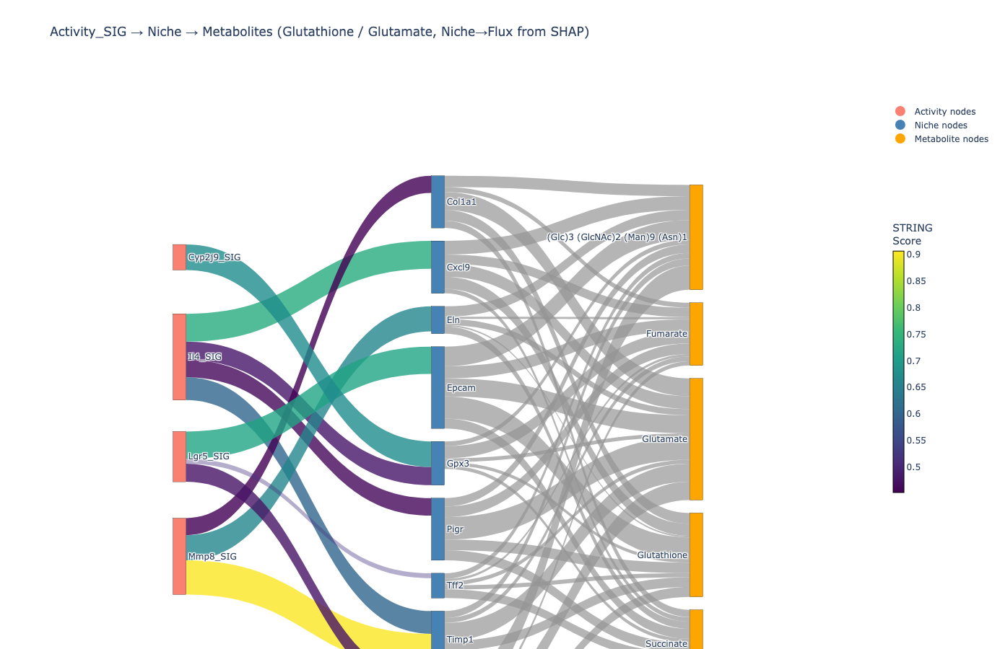

✓ Saved string_activity_niche_edges_with_shap.csv
✓ Saved string_shap_overlap_with_values.csv
✓ Saved string_pathway_enrichment.csv

Top 3 metabolites by aggregated SHAP (Niche→Flux):
  - Glutamate: total SHAP = 3.2147
  - (Glc)3 (GlcNAc)2 (Man)9 (Asn)1: total SHAP = 2.7724
  - Glutathione: total SHAP = 2.2159

SUMMARY STATISTICS
Activity genes (SHAP): 36
Niche genes (SHAP): 33
SHAP connections (Activity→Niche): 782
Total STRING edges: 40
Activity–Niche STRING connections (used): 11
✨ Overlap (SHAP + STRING, Activity→Niche): 10 (90.9%)
STRING-only Activity→Niche connections: 1
Niche→Flux SHAP edges used: 45
Flux nodes (metabolites): 5


In [44]:
#!/usr/bin/env python3
"""
Three-column Sankey:
  ACTIVITY_SIG → NICHE → FLUX (metabolites)

- Activity→Niche:
    * Based on STRING network ∩ SHAP (CSV2)
    * Width encodes STRING score (scaled, wider if also in SHAP)
    * Color encodes STRING score (viridis, alpha higher if in SHAP)
    * Hover shows STRING + SHAP

- Niche→Flux:
    * Based purely on Niche→Flux SHAP (CSV_NICHE_TO_FLUX)
    * Width encodes SHAP value
    * Edges colored grey
    * Hover shows SHAP value

- Flux (metabolite) nodes:
    * Colored orange
    * By default shows Glutathione & Glutamate only if present,
      otherwise all metabolites from Niche→Flux CSV.

Also prints top-3 metabolites by total SHAP value (sum of inbound edges).
"""

import pandas as pd
import numpy as np
import stringdb
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.cm as cm
from pathlib import Path

# ---------- INPUT ----------
CSV2 = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")
CSV_NICHE_TO_FLUX = Path("../Mongoose_post_hoc/niche_to_flux_shap_edges_with_ranks_cluster0_20251207_201807.csv")

MIN_WEIGHT = 0.1          # minimum SHAP value for Activity→Niche edges
TOP_N_EDGES = None        # or e.g. 200
CLUSTERS = None           # e.g. [0]; uses 'cluster' column if present
STRING_SPECIES = 10090    # Mouse (human = 9606)
STRING_SCORE_THRESHOLD = 400
# ---------------------------

palette = {"NICHE": "steelblue", "ACTIVITY": "salmon"}

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster": "cluster",
        "Source": "source",
        "Target": "target",
        "Value": "value",
        "Niche_rank": "niche_rank",
        "Activity_rank": "activity_rank"
    })

def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from activity genes."""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene

# ============================================================
# 1. LOAD ACTIVITY→NICHE SHAP CSV AND CLEAN
# ============================================================

df = pd.read_csv(CSV2)
df = _normalize_columns(df)

if CLUSTERS is not None and "cluster" in df.columns:
    df = df[df["cluster"].isin(CLUSTERS)].copy()

for c in ["value", "niche_rank", "activity_rank"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

df = df.dropna(subset=["source", "target", "value"])

# Aggregate SHAP edges between Activity and Niche
edges = (
    df.groupby(["source", "target"], as_index=False)["value"]
      .sum()
      .sort_values("value", ascending=False)
)
edges = edges[edges["value"] >= MIN_WEIGHT]
if TOP_N_EDGES:
    edges = edges.head(TOP_N_EDGES)

print(f"Filtered SHAP edges (Activity→Niche): {len(edges)}")

# SHAP dictionary for Activity→Niche
shap_edges_dict = {}
for _, row in edges.iterrows():
    source_clean = remove_suffix(str(row["source"])).upper()
    target_clean = str(row["target"]).upper()
    shap_edges_dict[(source_clean, target_clean)] = row["value"]

print(f"Unique SHAP connections (Activity→Niche): {len(shap_edges_dict)}")

# Activity & Niche gene sets from SHAP
activity_genes_raw = edges["source"].astype(str).unique()
niche_genes_shap = edges["target"].astype(str).unique()

activity_genes = [remove_suffix(g) for g in activity_genes_raw]
activity_genes = list(set(activity_genes))

print(f"Activity genes (after suffix removal): {len(activity_genes)}")
print(f"Niche genes (from SHAP): {len(niche_genes_shap)}")

all_genes = sorted(list(set(activity_genes) | set(niche_genes_shap)))
print(f"Total unique genes for STRING: {len(all_genes)}")

activity_set = {g.upper() for g in activity_genes}
niche_set_shap = {g.upper() for g in niche_genes_shap}

# ============================================================
# 2. STRING QUERY & NETWORK
# ============================================================

print("\nQuerying STRING database...")
string_ids = stringdb.get_string_ids(all_genes, species=STRING_SPECIES)
print(f"STRING IDs found: {len(string_ids)}")

print("\nPerforming pathway enrichment...")
enrichment_df = stringdb.get_enrichment(string_ids.queryItem, species=STRING_SPECIES)
sorted_enrichment = enrichment_df.sort_values(by="fdr", ascending=True)
top_10_pathways = sorted_enrichment["description"].head(10)

print("\nTop 10 Enriched Pathways:")
for i, pathway in enumerate(top_10_pathways, 1):
    fdr = sorted_enrichment.iloc[i - 1]["fdr"]
    print(f"{i}. {pathway} (FDR: {fdr:.2e})")

print(f"\nFetching STRING network (score ≥ {STRING_SCORE_THRESHOLD})...")
network_df = stringdb.get_network(
    string_ids.queryItem,
    species=STRING_SPECIES,
    required_score=STRING_SCORE_THRESHOLD
)
print(f"Total STRING edges: {len(network_df)}")

# ============================================================
# 3. ACTIVITY–NICHE SUBNETWORK (FROM STRING)
# ============================================================

edge_df = network_df.rename(columns={
    "preferredName_A": "gene1",
    "preferredName_B": "gene2",
    "score": "edge_weight"
}).copy()

edge_df["g1"] = edge_df["gene1"].str.upper()
edge_df["g2"] = edge_df["gene2"].str.upper()

# Keep only edges connecting Activity and Niche genes
filtered_edges = edge_df[
    ((edge_df["g1"].isin(activity_set)) & (edge_df["g2"].isin(niche_set_shap))) |
    ((edge_df["g1"].isin(niche_set_shap)) & (edge_df["g2"].isin(activity_set)))
].copy()

print(f"\nActivity–Niche STRING connections: {len(filtered_edges)}")

def assign_direction(row):
    """Ensure Activity genes are on the left, Niche on the right."""
    if row["g1"] in activity_set and row["g2"] in niche_set_shap:
        return pd.Series([row["gene1"], row["gene2"]])
    else:
        return pd.Series([row["gene2"], row["gene1"]])

filtered_edges[["source_sankey", "target_sankey"]] = filtered_edges.apply(
    assign_direction, axis=1
)

# ============================================================
# 4. MERGE SHAP (Activity→Niche) ONTO STRING EDGES
# ============================================================

def get_shap_value(row):
    key = (row["source_sankey"].upper(), row["target_sankey"].upper())
    return shap_edges_dict.get(key, np.nan)

filtered_edges["shap_value"] = filtered_edges.apply(get_shap_value, axis=1)
filtered_edges["in_shap"] = ~filtered_edges["shap_value"].isna()

overlap_count = filtered_edges["in_shap"].sum()
print(f"\n✨ Connections in BOTH SHAP and STRING (Activity→Niche): {overlap_count}/{len(filtered_edges)}")

overlap_df = filtered_edges[filtered_edges["in_shap"]].copy().sort_values("shap_value", ascending=False)
string_only_df = filtered_edges[~filtered_edges["in_shap"]].copy().sort_values("edge_weight", ascending=False)

# Prepare "visible" labels for Activity and Niche
activity_nodes_sankey = sorted(filtered_edges["source_sankey"].unique())
niche_nodes_sankey = sorted(filtered_edges["target_sankey"].unique())

# These will be used as node labels (Activity gets _SIG suffix)
activity_nodes_vis = [g + "_SIG" for g in activity_nodes_sankey]

# Map from canonical Niche name (STRING) to uppercase for flux CSV matching
niche_upper_to_name = {g.upper(): g for g in niche_nodes_sankey}

# ============================================================
# 5. LOAD NICHE→FLUX SHAP CSV AND CLEAN
# ============================================================

df_flux = pd.read_csv(CSV_NICHE_TO_FLUX)
# Columns: ['cluster_num', 'source', 'target', 'value', 'niche_rank']
df_flux["value"] = pd.to_numeric(df_flux["value"], errors="coerce")
df_flux = df_flux.dropna(subset=["source", "target", "value"])

# Keep cluster 0 (or adapt if needed)
if "cluster_num" in df_flux.columns:
    df_flux = df_flux[df_flux["cluster_num"] == 0].copy()

# Align Niche names with those from STRING (case-insensitive)
df_flux["source_upper"] = df_flux["source"].astype(str).str.upper()
df_flux = df_flux[df_flux["source_upper"].isin(niche_upper_to_name.keys())].copy()
df_flux["source_name"] = df_flux["source_upper"].map(niche_upper_to_name)

# Decide which metabolites to show
desired_flux = {"Glutathione", "Glutamate", "Succinate", "Fumarate", "(Glc)3 (GlcNAc)2 (Man)9 (Asn)1"}
flux_nodes_all = sorted(df_flux["target"].astype(str).unique())
flux_nodes = [m for m in flux_nodes_all if m in desired_flux]
if not flux_nodes:
    # If Glutathione / Glutamate not present, show all metabolites
    flux_nodes = flux_nodes_all

# Filter flux edges to only those metabolites we keep
df_flux = df_flux[df_flux["target"].isin(flux_nodes)].copy()

print(f"\nNiche→Flux SHAP edges used: {len(df_flux)}")
print(f"Flux (metabolite) nodes: {flux_nodes}")

# ============================================================
# 6. BUILD FINAL NODE LIST & COLORS
# ============================================================

nodes = activity_nodes_vis + niche_nodes_sankey + flux_nodes
node_index = {name: i for i, name in enumerate(nodes)}

flux_color = "#FFA500"  # orange
node_colors = (
    [palette["ACTIVITY"]] * len(activity_nodes_vis) +
    [palette["NICHE"]] * len(niche_nodes_sankey) +
    [flux_color] * len(flux_nodes)
)

print(
    f"Sankey nodes: {len(activity_nodes_vis)} Activity → "
    f"{len(niche_nodes_sankey)} Niche → {len(flux_nodes)} Metabolites"
)

# ============================================================
# 7. BUILD ACTIVITY→NICHE LINKS (STRING + SHAP)
# ============================================================

# STRING scores range
string_scores = filtered_edges["edge_weight"].tolist()
min_score = min(string_scores)
max_score = max(string_scores)
score_range = max_score - min_score if max_score != min_score else 1

# Visible names for mapping
filtered_edges["source_vis"] = filtered_edges["source_sankey"] + "_SIG"
filtered_edges["target_vis"] = filtered_edges["target_sankey"]

A_sources = []
A_targets = []
A_values = []
A_colors = []
A_labels = []

for _, row in filtered_edges.iterrows():
    src_name = row["source_vis"]
    tgt_name = row["target_vis"]

    if src_name not in node_index or tgt_name not in node_index:
        continue

    src_idx = node_index[src_name]
    tgt_idx = node_index[tgt_name]

    # Width: magnify if also in SHAP
    if row["in_shap"]:
        width = row["edge_weight"] * 2.0
    else:
        width = row["edge_weight"] * 0.5

    # Color: STRING score encoded with viridis; alpha reflects SHAP overlap
    score_norm = (row["edge_weight"] - min_score) / score_range
    cmap = cm.get_cmap("viridis")
    rgba = cmap(score_norm)
    alpha = 0.8 if row["in_shap"] else 0.4

    color = f"rgba({int(rgba[0]*255)}, {int(rgba[1]*255)}, {int(rgba[2]*255)}, {alpha})"

    # Hover label includes STRING + SHAP
    shap_val = row["shap_value"]
    if pd.notna(shap_val):
        shap_str = f"{shap_val:.4f}"
    else:
        shap_str = "NA"

    label = (
        f"{src_name} → {tgt_name}<br>"
        f"STRING score: {row['edge_weight']:.1f}<br>"
        f"SHAP value: {shap_str}"
    )

    A_sources.append(src_idx)
    A_targets.append(tgt_idx)
    A_values.append(width)
    A_colors.append(color)
    A_labels.append(label)

# ============================================================
# 8. BUILD NICHE→FLUX LINKS (FROM Niche→Flux SHAP CSV)
# ============================================================

F_sources = []
F_targets = []
F_values = []
F_colors = []
F_labels = []

# Simple scaling factor for SHAP→width
flux_width_scale = 2.0  # you can tweak this if widths look too small/large

for _, row in df_flux.iterrows():
    niche_name = row["source_name"]            # canonical Niche name (STRING)
    metab_name = str(row["target"])
    shap_val = float(row["value"])

    if niche_name not in node_index or metab_name not in node_index:
        continue

    src_idx = node_index[niche_name]
    tgt_idx = node_index[metab_name]

    width = max(shap_val, 0) * flux_width_scale  # non-negative width

    F_sources.append(src_idx)
    F_targets.append(tgt_idx)
    F_values.append(width)
    F_colors.append("rgba(150,150,150,0.7)")  # grey
    F_labels.append(
        f"{niche_name} → {metab_name}<br>"
        f"SHAP value: {shap_val:.4f}"
    )

# ============================================================
# 9. COMBINE LINKS AND BUILD SANKEY
# ============================================================

link_sources = A_sources + F_sources
link_targets = A_targets + F_targets
link_values = A_values + F_values
link_colors_all = A_colors + F_colors
link_labels_all = A_labels + F_labels

# Node positions: 3 vertical bands
x_positions = (
    [0.20] * len(activity_nodes_vis) +
    [0.50] * len(niche_nodes_sankey) +
    [0.80] * len(flux_nodes)
)

# Compress vertically in [0.15, 0.85]
y_activity = pd.Series(range(len(activity_nodes_vis))).rank(pct=True) * 0.70 + 0.15
y_niche    = pd.Series(range(len(niche_nodes_sankey))).rank(pct=True) * 0.70 + 0.15
y_flux     = pd.Series(range(len(flux_nodes))).rank(pct=True) * 0.70 + 0.15
y_positions = list(y_activity) + list(y_niche) + list(y_flux)

fig = go.Figure(data=[go.Sankey(
    arrangement="snap",
    orientation="h",

    node=dict(
        label=nodes,
        pad=18,
        thickness=18,
        x=x_positions,
        y=y_positions,
        color=node_colors,
        line=dict(color="black", width=0.3)
    ),

    link=dict(
        source=link_sources,
        target=link_targets,
        value=link_values,
        color=link_colors_all,
        label=link_labels_all,
        hovertemplate="%{label}<extra></extra>"
    )
)])

# STRING colorbar (Activity→Niche STRING scores)
fig.add_trace(go.Scatter(
    x=[None],
    y=[None],
    mode="markers",
    marker=dict(
        size=0.1,
        color=[min_score, max_score],
        colorscale="Viridis",
        showscale=True,
        colorbar=dict(
            title="STRING<br>Score",
            x=1.02,
            xanchor="left",
            len=0.5,
            thickness=15,
            outlinewidth=1,
            outlinecolor="black"
        )
    ),
    showlegend=False,
    hoverinfo="skip"
))

fig.update_layout(
    title="Activity_SIG → Niche → Metabolites (Glutathione / Glutamate, Niche→Flux from SHAP)",
    width=1700,
    height=900,
    font=dict(size=12),
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    margin=dict(l=10, r=120, t=100, b=10),
    xaxis=dict(visible=False, showgrid=False),
    yaxis=dict(visible=False, showgrid=False)
)

fig.write_html("string_sankey_activity_niche_flux_SHAP.html")
print("\n✓ Saved string_sankey_activity_niche_flux_SHAP.html")



# ============================================================
# ADD LEGEND FOR NODE & EDGE MEANINGS
# ============================================================

# ============================================================
# MINIMAL LEGEND — NODE TYPES ONLY, NO BACKGROUND
# ============================================================

fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode="markers",
    marker=dict(size=14, color=palette["ACTIVITY"]),
    name="Activity nodes"
))

fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode="markers",
    marker=dict(size=14, color=palette["NICHE"]),
    name="Niche nodes"
))

fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode="markers",
    marker=dict(size=14, color=flux_color),  # orange metabolites
    name="Metabolite nodes"
))

fig.update_layout(
    legend=dict(
        x=1.02,
        y=0.95,
        bgcolor="rgba(0,0,0,0)",   # fully transparent background
        borderwidth=0,            # no border
        font=dict(size=12)
    )
)



fig.show()

# ============================================================
# 10. EXPORTS & TOP-3 METABOLITES BY SHAP
# ============================================================

filtered_edges.to_csv("string_activity_niche_edges_with_shap.csv", index=False)
print("✓ Saved string_activity_niche_edges_with_shap.csv")

overlap_df.to_csv("string_shap_overlap_with_values.csv", index=False)
print("✓ Saved string_shap_overlap_with_values.csv")

sorted_enrichment.to_csv("string_pathway_enrichment.csv", index=False)
print("✓ Saved string_pathway_enrichment.csv")

# Top-3 metabolites by total SHAP from Niche→Flux
metab_agg = (
    df_flux.groupby("target", as_index=False)["value"]
           .sum()
           .sort_values("value", ascending=False)
)

print("\nTop 3 metabolites by aggregated SHAP (Niche→Flux):")
for _, row in metab_agg.head(3).iterrows():
    print(f"  - {row['target']}: total SHAP = {row['value']:.4f}")

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(f"Activity genes (SHAP): {len(activity_genes)}")
print(f"Niche genes (SHAP): {len(niche_genes_shap)}")
print(f"SHAP connections (Activity→Niche): {len(shap_edges_dict)}")
print(f"Total STRING edges: {len(network_df)}")
print(f"Activity–Niche STRING connections (used): {len(filtered_edges)}")
print(f"✨ Overlap (SHAP + STRING, Activity→Niche): {overlap_count} "
      f"({100 * overlap_count / len(filtered_edges):.1f}%)")
print(f"STRING-only Activity→Niche connections: {len(string_only_df)}")
print(f"Niche→Flux SHAP edges used: {len(df_flux)}")
print(f"Flux nodes (metabolites): {len(flux_nodes)}")
print("="*80)


In [3]:
#!/usr/bin/env python3
"""
Three-column Sankey with PNG export:
  ACTIVITY_SIG → NICHE → FLUX (metabolites)

Exports both HTML and 300 DPI PNG to ../Figures/Figure_1/

PRINT-OPTIMIZED SETTINGS:
- Node positions: x=0.25, 0.50, 0.75 (moved inward from edges)
- Margins: l=50, r=150, t=120, b=100 (extra bottom margin to prevent clipping)
- Canvas size: 1800×1100 (increased height for better spacing)
- Node padding: 20px (increased for visibility)
- Vertical span: 0.12-0.85 (73% of height, keeps nodes away from edges)
All adjustments ensure nodes are fully visible in printed/exported output.
"""

import pandas as pd
import numpy as np
import stringdb
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.cm as cm
from pathlib import Path

# ---------- INPUT ----------
CSV2 = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")
CSV_NICHE_TO_FLUX = Path("../Mongoose_post_hoc/niche_to_flux_shap_edges_with_ranks_cluster0_20251207_201807.csv")

MIN_WEIGHT = 0.1          # minimum SHAP value for Activity→Niche edges
TOP_N_EDGES = None        # or e.g. 200
CLUSTERS = None           # e.g. [0]; uses 'cluster' column if present
STRING_SPECIES = 10090    # Mouse (human = 9606)
STRING_SCORE_THRESHOLD = 400

# Output settings
OUTPUT_DIR = Path("../Figures/Figure_1")
OUTPUT_HTML = "string_sankey_activity_niche_flux_SHAP.html"
OUTPUT_PNG = "string_sankey_activity_niche_flux_SHAP.png"
OUTPUT_DPI = 300
# ---------------------------

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

palette = {"NICHE": "steelblue", "ACTIVITY": "salmon"}

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster": "cluster",
        "Source": "source",
        "Target": "target",
        "Value": "value",
        "Niche_rank": "niche_rank",
        "Activity_rank": "activity_rank"
    })

def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from activity genes."""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene

# ============================================================
# 1. LOAD ACTIVITY→NICHE SHAP CSV AND CLEAN
# ============================================================

df = pd.read_csv(CSV2)
df = _normalize_columns(df)

if CLUSTERS is not None and "cluster" in df.columns:
    df = df[df["cluster"].isin(CLUSTERS)].copy()

for c in ["value", "niche_rank", "activity_rank"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

df = df.dropna(subset=["source", "target", "value"])

# Aggregate SHAP edges between Activity and Niche
edges = (
    df.groupby(["source", "target"], as_index=False)["value"]
      .sum()
      .sort_values("value", ascending=False)
)
edges = edges[edges["value"] >= MIN_WEIGHT]
if TOP_N_EDGES:
    edges = edges.head(TOP_N_EDGES)

print(f"Filtered SHAP edges (Activity→Niche): {len(edges)}")

# SHAP dictionary for Activity→Niche
shap_edges_dict = {}
for _, row in edges.iterrows():
    source_clean = remove_suffix(str(row["source"])).upper()
    target_clean = str(row["target"]).upper()
    shap_edges_dict[(source_clean, target_clean)] = row["value"]

print(f"Unique SHAP connections (Activity→Niche): {len(shap_edges_dict)}")

# Activity & Niche gene sets from SHAP
activity_genes_raw = edges["source"].astype(str).unique()
niche_genes_shap = edges["target"].astype(str).unique()

activity_genes = [remove_suffix(g) for g in activity_genes_raw]
activity_genes = list(set(activity_genes))

print(f"Activity genes (after suffix removal): {len(activity_genes)}")
print(f"Niche genes (from SHAP): {len(niche_genes_shap)}")

all_genes = sorted(list(set(activity_genes) | set(niche_genes_shap)))
print(f"Total unique genes for STRING: {len(all_genes)}")

activity_set = {g.upper() for g in activity_genes}
niche_set_shap = {g.upper() for g in niche_genes_shap}

# ============================================================
# 2. STRING QUERY & NETWORK
# ============================================================

print("\nQuerying STRING database...")
string_ids = stringdb.get_string_ids(all_genes, species=STRING_SPECIES)
print(f"STRING IDs found: {len(string_ids)}")

print("\nPerforming pathway enrichment...")
enrichment_df = stringdb.get_enrichment(string_ids.queryItem, species=STRING_SPECIES)
sorted_enrichment = enrichment_df.sort_values(by="fdr", ascending=True)
top_10_pathways = sorted_enrichment["description"].head(10)

print("\nTop 10 Enriched Pathways:")
for i, pathway in enumerate(top_10_pathways, 1):
    fdr = sorted_enrichment.iloc[i - 1]["fdr"]
    print(f"{i}. {pathway} (FDR: {fdr:.2e})")

print(f"\nFetching STRING network (score ≥ {STRING_SCORE_THRESHOLD})...")
network_df = stringdb.get_network(
    string_ids.queryItem,
    species=STRING_SPECIES,
    required_score=STRING_SCORE_THRESHOLD
)
print(f"Total STRING edges: {len(network_df)}")

# ============================================================
# 3. ACTIVITY–NICHE SUBNETWORK (FROM STRING)
# ============================================================

edge_df = network_df.rename(columns={
    "preferredName_A": "gene1",
    "preferredName_B": "gene2",
    "score": "edge_weight"
}).copy()

edge_df["g1"] = edge_df["gene1"].str.upper()
edge_df["g2"] = edge_df["gene2"].str.upper()

# Keep only edges connecting Activity and Niche genes
filtered_edges = edge_df[
    ((edge_df["g1"].isin(activity_set)) & (edge_df["g2"].isin(niche_set_shap))) |
    ((edge_df["g1"].isin(niche_set_shap)) & (edge_df["g2"].isin(activity_set)))
].copy()

print(f"\nActivity–Niche STRING connections: {len(filtered_edges)}")

def assign_direction(row):
    """Ensure Activity genes are on the left, Niche on the right."""
    if row["g1"] in activity_set and row["g2"] in niche_set_shap:
        return pd.Series([row["gene1"], row["gene2"]])
    else:
        return pd.Series([row["gene2"], row["gene1"]])

filtered_edges[["source_sankey", "target_sankey"]] = filtered_edges.apply(
    assign_direction, axis=1
)

# ============================================================
# 4. MERGE SHAP (Activity→Niche) ONTO STRING EDGES
# ============================================================

def get_shap_value(row):
    key = (row["source_sankey"].upper(), row["target_sankey"].upper())
    return shap_edges_dict.get(key, np.nan)

filtered_edges["shap_value"] = filtered_edges.apply(get_shap_value, axis=1)
filtered_edges["in_shap"] = ~filtered_edges["shap_value"].isna()

overlap_count = filtered_edges["in_shap"].sum()
print(f"\n✨ Connections in BOTH SHAP and STRING (Activity→Niche): {overlap_count}/{len(filtered_edges)}")

overlap_df = filtered_edges[filtered_edges["in_shap"]].copy().sort_values("shap_value", ascending=False)
string_only_df = filtered_edges[~filtered_edges["in_shap"]].copy().sort_values("edge_weight", ascending=False)

# Prepare "visible" labels for Activity and Niche
activity_nodes_sankey = sorted(filtered_edges["source_sankey"].unique())
niche_nodes_sankey = sorted(filtered_edges["target_sankey"].unique())

# These will be used as node labels (Activity gets _SIG suffix)
activity_nodes_vis = [g + "_SIG" for g in activity_nodes_sankey]

# Map from canonical Niche name (STRING) to uppercase for flux CSV matching
niche_upper_to_name = {g.upper(): g for g in niche_nodes_sankey}

# ============================================================
# 5. LOAD NICHE→FLUX SHAP CSV AND CLEAN
# ============================================================

df_flux = pd.read_csv(CSV_NICHE_TO_FLUX)
df_flux["value"] = pd.to_numeric(df_flux["value"], errors="coerce")
df_flux = df_flux.dropna(subset=["source", "target", "value"])

# Keep cluster 0 (or adapt if needed)
if "cluster_num" in df_flux.columns:
    df_flux = df_flux[df_flux["cluster_num"] == 0].copy()

# Align Niche names with those from STRING (case-insensitive)
df_flux["source_upper"] = df_flux["source"].astype(str).str.upper()
df_flux = df_flux[df_flux["source_upper"].isin(niche_upper_to_name.keys())].copy()
df_flux["source_name"] = df_flux["source_upper"].map(niche_upper_to_name)

# Decide which metabolites to show
desired_flux = {"Glutathione", "Glutamate", "Succinate", "Fumarate", "(Glc)3 (GlcNAc)2 (Man)9 (Asn)1"}
flux_nodes_all = sorted(df_flux["target"].astype(str).unique())
flux_nodes = [m for m in flux_nodes_all if m in desired_flux]
if not flux_nodes:
    flux_nodes = flux_nodes_all

# Filter flux edges to only those metabolites we keep
df_flux = df_flux[df_flux["target"].isin(flux_nodes)].copy()

print(f"\nNiche→Flux SHAP edges used: {len(df_flux)}")
print(f"Flux (metabolite) nodes: {flux_nodes}")

# ============================================================
# 6. BUILD FINAL NODE LIST & COLORS
# ============================================================

nodes = activity_nodes_vis + niche_nodes_sankey + flux_nodes
node_index = {name: i for i, name in enumerate(nodes)}

flux_color = "#FFA500"  # orange
node_colors = (
    [palette["ACTIVITY"]] * len(activity_nodes_vis) +
    [palette["NICHE"]] * len(niche_nodes_sankey) +
    [flux_color] * len(flux_nodes)
)

print(
    f"Sankey nodes: {len(activity_nodes_vis)} Activity → "
    f"{len(niche_nodes_sankey)} Niche → {len(flux_nodes)} Metabolites"
)

# ============================================================
# 7. BUILD ACTIVITY→NICHE LINKS (STRING + SHAP)
# ============================================================

string_scores = filtered_edges["edge_weight"].tolist()
min_score = min(string_scores)
max_score = max(string_scores)
score_range = max_score - min_score if max_score != min_score else 1

filtered_edges["source_vis"] = filtered_edges["source_sankey"] + "_SIG"
filtered_edges["target_vis"] = filtered_edges["target_sankey"]

A_sources = []
A_targets = []
A_values = []
A_colors = []
A_labels = []

for _, row in filtered_edges.iterrows():
    src_name = row["source_vis"]
    tgt_name = row["target_vis"]

    if src_name not in node_index or tgt_name not in node_index:
        continue

    src_idx = node_index[src_name]
    tgt_idx = node_index[tgt_name]

    if row["in_shap"]:
        width = row["edge_weight"] * 2.0
    else:
        width = row["edge_weight"] * 0.5

    score_norm = (row["edge_weight"] - min_score) / score_range
    cmap = cm.get_cmap("viridis")
    rgba = cmap(score_norm)
    alpha = 0.8 if row["in_shap"] else 0.4

    color = f"rgba({int(rgba[0]*255)}, {int(rgba[1]*255)}, {int(rgba[2]*255)}, {alpha})"

    shap_val = row["shap_value"]
    shap_str = f"{shap_val:.4f}" if pd.notna(shap_val) else "NA"

    label = (
        f"{src_name} → {tgt_name}<br>"
        f"STRING score: {row['edge_weight']:.1f}<br>"
        f"SHAP value: {shap_str}"
    )

    A_sources.append(src_idx)
    A_targets.append(tgt_idx)
    A_values.append(width)
    A_colors.append(color)
    A_labels.append(label)

# ============================================================
# 8. BUILD NICHE→FLUX LINKS (FROM Niche→Flux SHAP CSV)
# ============================================================

F_sources = []
F_targets = []
F_values = []
F_colors = []
F_labels = []

flux_width_scale = 2.0

for _, row in df_flux.iterrows():
    niche_name = row["source_name"]
    metab_name = str(row["target"])
    shap_val = float(row["value"])

    if niche_name not in node_index or metab_name not in node_index:
        continue

    src_idx = node_index[niche_name]
    tgt_idx = node_index[metab_name]

    width = max(shap_val, 0) * flux_width_scale

    F_sources.append(src_idx)
    F_targets.append(tgt_idx)
    F_values.append(width)
    F_colors.append("rgba(150,150,150,0.7)")
    F_labels.append(
        f"{niche_name} → {metab_name}<br>"
        f"SHAP value: {shap_val:.4f}"
    )

# ============================================================
# 9. COMBINE LINKS AND BUILD SANKEY
# ============================================================

link_sources = A_sources + F_sources
link_targets = A_targets + F_targets
link_values = A_values + F_values
link_colors_all = A_colors + F_colors
link_labels_all = A_labels + F_labels

# Node positions: 3 vertical bands - adjusted to avoid clipping
# Moved inward from edges to ensure visibility
x_positions = (
    [0.25] * len(activity_nodes_vis) +    # was 0.20, now more inward
    [0.50] * len(niche_nodes_sankey) +
    [0.75] * len(flux_nodes)              # was 0.80, now more inward
)

# Compress vertically in [0.12, 0.85] to keep nodes away from top and bottom edges
y_activity = pd.Series(range(len(activity_nodes_vis))).rank(pct=True) * 0.73 + 0.12
y_niche    = pd.Series(range(len(niche_nodes_sankey))).rank(pct=True) * 0.73 + 0.12
y_flux     = pd.Series(range(len(flux_nodes))).rank(pct=True) * 0.73 + 0.12
y_positions = list(y_activity) + list(y_niche) + list(y_flux)

fig = go.Figure(data=[go.Sankey(
    arrangement="snap",
    orientation="h",

    node=dict(
        label=nodes,
        pad=20,        # increased from 18 for more spacing
        thickness=20,  # increased from 18 for better visibility
        x=x_positions,
        y=y_positions,
        color=node_colors,
        line=dict(color="black", width=0.3)
    ),

    link=dict(
        source=link_sources,
        target=link_targets,
        value=link_values,
        color=link_colors_all,
        label=link_labels_all,
        hovertemplate="%{label}<extra></extra>"
    )
)])

# STRING colorbar
fig.add_trace(go.Scatter(
    x=[None],
    y=[None],
    mode="markers",
    marker=dict(
        size=0.1,
        color=[min_score, max_score],
        colorscale="Viridis",
        showscale=True,
        colorbar=dict(
            title="STRING<br>Score",
            x=1.05,          # moved further right from 1.02
            xanchor="left",
            len=0.5,
            thickness=15,
            outlinewidth=1,
            outlinecolor="black"
        )
    ),
    showlegend=False,
    hoverinfo="skip"
))

fig.update_layout(
    title="Activity_SIG → Niche → Metabolites (Glutathione / Glutamate, Niche→Flux from SHAP)",
    width=1800,   # increased from 1700 for more space
    height=1100,  # increased from 1000 for more vertical space
    font=dict(size=12),
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    margin=dict(l=50, r=150, t=120, b=100),  # increased bottom margin: b=100 (was 50)
    xaxis=dict(visible=False, showgrid=False),
    yaxis=dict(visible=False, showgrid=False)
)

# Legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode="markers",
    marker=dict(size=14, color=palette["ACTIVITY"]),
    name="Activity nodes"
))

fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode="markers",
    marker=dict(size=14, color=palette["NICHE"]),
    name="Niche nodes"
))

fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode="markers",
    marker=dict(size=14, color=flux_color),
    name="Metabolite nodes"
))

fig.update_layout(
    legend=dict(
        x=1.05,           # moved further right to align with colorbar
        y=0.90,           # moved down slightly from 0.95
        bgcolor="rgba(0,0,0,0)",
        borderwidth=0,
        font=dict(size=12)
    )
)

# ============================================================
# 10. SAVE OUTPUTS (HTML + PNG)
# ============================================================

# Save HTML
fig.write_html(OUTPUT_HTML)
print(f"\n✓ Saved {OUTPUT_HTML}")

# Save PNG at 300 DPI
dpi_scale = OUTPUT_DPI / 100  # scale factor for target DPI
output_png_path = OUTPUT_DIR / OUTPUT_PNG

try:
    fig.write_image(str(output_png_path), scale=dpi_scale)
    print(f"✓ Saved {output_png_path} at {OUTPUT_DPI} DPI")
except Exception as e:
    print(f"⚠ Could not save PNG: {e}")
    print("  Install kaleido: pip install kaleido")
    print("  Or use: conda install -c conda-forge python-kaleido")

# Save CSV exports
filtered_edges.to_csv("string_activity_niche_edges_with_shap.csv", index=False)
print("✓ Saved string_activity_niche_edges_with_shap.csv")

overlap_df.to_csv("string_shap_overlap_with_values.csv", index=False)
print("✓ Saved string_shap_overlap_with_values.csv")

sorted_enrichment.to_csv("string_pathway_enrichment.csv", index=False)
print("✓ Saved string_pathway_enrichment.csv")

# Top-3 metabolites
metab_agg = (
    df_flux.groupby("target", as_index=False)["value"]
           .sum()
           .sort_values("value", ascending=False)
)

print("\nTop 3 metabolites by aggregated SHAP (Niche→Flux):")
for _, row in metab_agg.head(3).iterrows():
    print(f"  - {row['target']}: total SHAP = {row['value']:.4f}")

# Summary statistics
print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
print(f"Activity genes (SHAP): {len(activity_genes)}")
print(f"Niche genes (SHAP): {len(niche_genes_shap)}")
print(f"SHAP connections (Activity→Niche): {len(shap_edges_dict)}")
print(f"Total STRING edges: {len(network_df)}")
print(f"Activity–Niche STRING connections (used): {len(filtered_edges)}")
print(f"✨ Overlap (SHAP + STRING, Activity→Niche): {overlap_count} "
      f"({100 * overlap_count / len(filtered_edges):.1f}%)")
print(f"STRING-only Activity→Niche connections: {len(string_only_df)}")
print(f"Niche→Flux SHAP edges used: {len(df_flux)}")
print(f"Flux nodes (metabolites): {len(flux_nodes)}")
print(f"\nOutput directory: {OUTPUT_DIR.absolute()}")
print("="*80)

Filtered SHAP edges (Activity→Niche): 801
Unique SHAP connections (Activity→Niche): 782
Activity genes (after suffix removal): 36
Niche genes (from SHAP): 33
Total unique genes for STRING: 69

Querying STRING database...
STRING IDs found: 61

Performing pathway enrichment...

Top 10 Enriched Pathways:
1. Extracellular space (FDR: 7.39e-08)
2. Secreted (FDR: 7.82e-07)
3. Extracellular region (FDR: 1.04e-05)
4. Disulfide bond (FDR: 7.85e-05)
5. Glycoprotein (FDR: 7.85e-05)
6. Repeat (FDR: 9.17e-05)
7. Signal (FDR: 1.60e-04)
8. Extracellular region (FDR: 1.70e-04)
9. (2013) The link between chronic periodontitis and COPD: a common role for the neutrophil? (FDR: 3.70e-04)
10. (2021) An integrated multiomic and quantitative label-free microscopy-based approach to study pro-fibrotic signalling in ex vivo human precision-cut lung slices. (FDR: 3.70e-04)

Fetching STRING network (score ≥ 400)...
Total STRING edges: 40

Activity–Niche STRING connections: 11

✨ Connections in BOTH SHAP and STRIN

/tmp/ipykernel_568375/3543599533.py:469: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




✓ Saved ../Figures/Figure_1/string_sankey_activity_niche_flux_SHAP.png at 300 DPI
✓ Saved string_activity_niche_edges_with_shap.csv
✓ Saved string_shap_overlap_with_values.csv
✓ Saved string_pathway_enrichment.csv

Top 3 metabolites by aggregated SHAP (Niche→Flux):
  - Glutamate: total SHAP = 3.2147
  - (Glc)3 (GlcNAc)2 (Man)9 (Asn)1: total SHAP = 2.7724
  - Glutathione: total SHAP = 2.2159

SUMMARY STATISTICS
Activity genes (SHAP): 36
Niche genes (SHAP): 33
SHAP connections (Activity→Niche): 782
Total STRING edges: 40
Activity–Niche STRING connections (used): 11
✨ Overlap (SHAP + STRING, Activity→Niche): 10 (90.9%)
STRING-only Activity→Niche connections: 1
Niche→Flux SHAP edges used: 45
Flux nodes (metabolites): 5

Output directory: /home/ggavriilidis/Mongoose/Scripts/../Figures/Figure_1


In [1]:
#!/usr/bin/env python3
"""
Analyze SHAP edge data to compute node-level statistics:
  - Number of connections (in-degree, out-degree)
  - Aggregate SHAP scores
  - Top hubs for Activity, Niche, and Flux nodes
"""

import pandas as pd
import numpy as np
from pathlib import Path

# ========== INPUT PATHS (from Sankey code) ==========
CSV_ACTIVITY_TO_NICHE = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")
CSV_NICHE_TO_FLUX = Path("../Mongoose_post_hoc/niche_to_flux_shap_edges_with_ranks_cluster0_20251207_201807.csv")

OUTPUT_PREFIX = "shap_node_stats"
# ====================================================

def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from activity genes."""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene


def analyze_edges(df, source_col="source", target_col="target", value_col="value", 
                  edge_type="Unknown"):
    """
    Compute node-level statistics from edge dataframe.
    
    Returns:
        source_stats: DataFrame with stats for source nodes
        target_stats: DataFrame with stats for target nodes
    """
    # Clean gene names in source (remove suffixes)
    df["source_clean"] = df[source_col].apply(remove_suffix)
    df["target_clean"] = df[target_col].astype(str)
    
    # Source node statistics (out-degree and outgoing SHAP)
    source_stats = df.groupby("source_clean").agg(
        num_connections=(value_col, "count"),
        total_shap=(value_col, "sum"),
        mean_shap=(value_col, "mean"),
        max_shap=(value_col, "max"),
        min_shap=(value_col, "min")
    ).reset_index()
    source_stats.columns = ["gene", "out_degree", "total_shap", "mean_shap", 
                            "max_shap", "min_shap"]
    source_stats["node_type"] = edge_type.split("→")[0].strip()
    
    # Target node statistics (in-degree and incoming SHAP)
    target_stats = df.groupby("target_clean").agg(
        num_connections=(value_col, "count"),
        total_shap=(value_col, "sum"),
        mean_shap=(value_col, "mean"),
        max_shap=(value_col, "max"),
        min_shap=(value_col, "min")
    ).reset_index()
    target_stats.columns = ["gene", "in_degree", "total_shap", "mean_shap", 
                            "max_shap", "min_shap"]
    target_stats["node_type"] = edge_type.split("→")[1].strip()
    
    return source_stats, target_stats


def print_top_nodes(df, title, top_n=20):
    """Pretty print top N nodes by total SHAP."""
    print(f"\n{'='*80}")
    print(f"{title}")
    print(f"{'='*80}")
    print(f"{'Rank':<6} {'Gene':<25} {'Connections':<12} {'Total SHAP':<15} {'Mean SHAP':<12}")
    print("-" * 80)
    
    for idx, row in df.head(top_n).iterrows():
        rank = idx + 1
        gene = row["gene"]
        conn_col = "out_degree" if "out_degree" in row else "in_degree"
        n_conn = int(row[conn_col])
        total_shap = row["total_shap"]
        mean_shap = row["mean_shap"]
        
        print(f"{rank:<6} {gene:<25} {n_conn:<12} {total_shap:<15.4f} {mean_shap:<12.4f}")


# ============================================================
# 1. LOAD AND ANALYZE ACTIVITY→NICHE EDGES
# ============================================================

print("Loading Activity→Niche SHAP edges...")
df_act_niche = pd.read_csv(CSV_ACTIVITY_TO_NICHE)

# Normalize column names
df_act_niche = df_act_niche.rename(columns={
    "Source": "source",
    "Target": "target",
    "Value": "value"
})

# Convert value to numeric
df_act_niche["value"] = pd.to_numeric(df_act_niche["value"], errors="coerce")
df_act_niche = df_act_niche.dropna(subset=["source", "target", "value"])

print(f"Loaded {len(df_act_niche)} Activity→Niche edges")

# Analyze
activity_stats, niche_stats_from_act = analyze_edges(
    df_act_niche, 
    edge_type="Activity → Niche"
)

# Sort by total SHAP
activity_stats = activity_stats.sort_values("total_shap", ascending=False).reset_index(drop=True)
niche_stats_from_act = niche_stats_from_act.sort_values("total_shap", ascending=False).reset_index(drop=True)

# ============================================================
# 2. LOAD AND ANALYZE NICHE→FLUX EDGES
# ============================================================

print("\nLoading Niche→Flux SHAP edges...")
df_niche_flux = pd.read_csv(CSV_NICHE_TO_FLUX)

# Expected columns: cluster_num, source, target, value, niche_rank
df_niche_flux["value"] = pd.to_numeric(df_niche_flux["value"], errors="coerce")
df_niche_flux = df_niche_flux.dropna(subset=["source", "target", "value"])

print(f"Loaded {len(df_niche_flux)} Niche→Flux edges")

# Analyze
niche_stats_from_flux, flux_stats = analyze_edges(
    df_niche_flux,
    edge_type="Niche → Flux"
)

# Sort by total SHAP
niche_stats_from_flux = niche_stats_from_flux.sort_values("total_shap", ascending=False).reset_index(drop=True)
flux_stats = flux_stats.sort_values("total_shap", ascending=False).reset_index(drop=True)

# ============================================================
# 3. COMBINE NICHE STATISTICS (from both edges)
# ============================================================

# Niche genes appear as targets in Activity→Niche and sources in Niche→Flux
# Merge to get comprehensive Niche statistics

niche_combined = pd.merge(
    niche_stats_from_act[["gene", "in_degree", "total_shap", "mean_shap"]],
    niche_stats_from_flux[["gene", "out_degree", "total_shap", "mean_shap"]],
    on="gene",
    how="outer",
    suffixes=("_from_activity", "_from_flux")
)

# Fill NaN with 0 for genes that only appear in one direction
niche_combined = niche_combined.fillna(0)

# Compute total degree and total SHAP across both directions
niche_combined["total_degree"] = (
    niche_combined["in_degree"].astype(int) + 
    niche_combined["out_degree"].astype(int)
)
niche_combined["total_shap_combined"] = (
    niche_combined["total_shap_from_activity"] + 
    niche_combined["total_shap_from_flux"]
)

niche_combined = niche_combined.sort_values("total_shap_combined", ascending=False).reset_index(drop=True)

# ============================================================
# 4. PRINT TOP HUBS
# ============================================================

print_top_nodes(
    activity_stats, 
    "TOP 20 ACTIVITY NODES (by total outgoing SHAP to Niche)",
    top_n=20
)

print_top_nodes(
    niche_stats_from_act,
    "TOP 20 NICHE NODES (by total incoming SHAP from Activity)",
    top_n=20
)

print_top_nodes(
    niche_stats_from_flux,
    "TOP 20 NICHE NODES (by total outgoing SHAP to Flux)",
    top_n=20
)

print_top_nodes(
    flux_stats,
    "TOP 20 FLUX/METABOLITE NODES (by total incoming SHAP from Niche)",
    top_n=20
)

# ============================================================
# 5. COMBINED NICHE HUB ANALYSIS
# ============================================================

print(f"\n{'='*80}")
print("TOP 20 NICHE HUBS (combined Activity→Niche→Flux)")
print(f"{'='*80}")
print(f"{'Rank':<6} {'Gene':<20} {'In°':<6} {'Out°':<6} {'Tot°':<6} "
      f"{'SHAP(Act)':<12} {'SHAP(Flux)':<12} {'SHAP(Total)':<12}")
print("-" * 80)

for idx, row in niche_combined.head(20).iterrows():
    rank = idx + 1
    gene = row["gene"]
    in_deg = int(row["in_degree"])
    out_deg = int(row["out_degree"])
    tot_deg = int(row["total_degree"])
    shap_act = row["total_shap_from_activity"]
    shap_flux = row["total_shap_from_flux"]
    shap_tot = row["total_shap_combined"]
    
    print(f"{rank:<6} {gene:<20} {in_deg:<6} {out_deg:<6} {tot_deg:<6} "
          f"{shap_act:<12.4f} {shap_flux:<12.4f} {shap_tot:<12.4f}")

# ============================================================
# 6. SAVE TO CSV
# ============================================================

activity_stats.to_csv(f"{OUTPUT_PREFIX}_activity.csv", index=False)
print(f"\n✓ Saved {OUTPUT_PREFIX}_activity.csv")

niche_combined.to_csv(f"{OUTPUT_PREFIX}_niche_combined.csv", index=False)
print(f"✓ Saved {OUTPUT_PREFIX}_niche_combined.csv")

flux_stats.to_csv(f"{OUTPUT_PREFIX}_flux.csv", index=False)
print(f"✓ Saved {OUTPUT_PREFIX}_flux.csv")

# ============================================================
# 7. SUMMARY STATISTICS
# ============================================================

print(f"\n{'='*80}")
print("NETWORK SUMMARY")
print(f"{'='*80}")

print(f"\nActivity genes: {len(activity_stats)}")
print(f"  - Total outgoing connections: {activity_stats['out_degree'].sum():.0f}")
print(f"  - Mean connections per gene: {activity_stats['out_degree'].mean():.2f}")
print(f"  - Total SHAP distributed: {activity_stats['total_shap'].sum():.4f}")

print(f"\nNiche genes: {len(niche_combined)}")
print(f"  - Total degree (in+out): {niche_combined['total_degree'].sum():.0f}")
print(f"  - Mean total degree: {niche_combined['total_degree'].mean():.2f}")
print(f"  - Total SHAP (combined): {niche_combined['total_shap_combined'].sum():.4f}")

print(f"\nFlux/Metabolite nodes: {len(flux_stats)}")
print(f"  - Total incoming connections: {flux_stats['in_degree'].sum():.0f}")
print(f"  - Mean connections per metabolite: {flux_stats['in_degree'].mean():.2f}")
print(f"  - Total SHAP received: {flux_stats['total_shap'].sum():.4f}")

print(f"\n{'='*80}")
print("KEY HUB GENES (Top 5 by total SHAP)")
print(f"{'='*80}")

print("\n🔵 Top 5 Activity hubs:")
for idx, row in activity_stats.head(5).iterrows():
    print(f"  {idx+1}. {row['gene']} → {row['out_degree']:.0f} connections, "
          f"SHAP={row['total_shap']:.4f}")

print("\n🟢 Top 5 Niche hubs (combined):")
for idx, row in niche_combined.head(5).iterrows():
    print(f"  {idx+1}. {row['gene']} → "
          f"in={row['in_degree']:.0f}, out={row['out_degree']:.0f}, "
          f"SHAP={row['total_shap_combined']:.4f}")

print("\n🟠 Top 5 Flux/Metabolite sinks:")
for idx, row in flux_stats.head(5).iterrows():
    print(f"  {idx+1}. {row['gene']} ← {row['in_degree']:.0f} connections, "
          f"SHAP={row['total_shap']:.4f}")

print(f"\n{'='*80}\n")

Loading Activity→Niche SHAP edges...
Loaded 1221 Activity→Niche edges

Loading Niche→Flux SHAP edges...
Loaded 1650 Niche→Flux edges

TOP 20 ACTIVITY NODES (by total outgoing SHAP to Niche)
Rank   Gene                      Connections  Total SHAP      Mean SHAP   
--------------------------------------------------------------------------------
1      Zfp78                     66           17.4653         0.2646      
2      Slc25a43                  33           11.6451         0.3529      
3      Gm9008                    33           11.2717         0.3416      
4      Eda                       33           10.2220         0.3098      
5      Syt17                     33           9.7528          0.2955      
6      Tdgf1                     33           9.6049          0.2911      
7      Slc8a2                    33           9.1107          0.2761      
8      Fzd3                      33           8.2562          0.2502      
9      Cd70                      33           8.1178  

In [3]:
#!/usr/bin/env python3
"""
Visualize node-level SHAP statistics:
  - Distribution of connections per node
  - SHAP vs degree scatter plots
  - Top hubs bar charts
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import numpy as np

# Input files (generated by shap_node_statistics.py)
ACTIVITY_STATS = "shap_node_stats_activity.csv"
NICHE_STATS = "shap_node_stats_niche_combined.csv"
FLUX_STATS = "shap_node_stats_flux.csv"

# Output directory
OUTPUT_DIR = Path("shap_stats_plots")
OUTPUT_DIR.mkdir(exist_ok=True)

# Styling
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 150

def plot_top_hubs(df, node_type, degree_col, shap_col=None, top_n=20, figsize=(12, 8)):
    """Bar chart of top hubs by total SHAP."""
    # Determine SHAP column name based on node type
    if shap_col is None:
        shap_col = "total_shap_combined" if node_type == "Niche" else "total_shap"
    
    top = df.nlargest(top_n, shap_col).copy()
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Plot 1: Total SHAP
    ax1.barh(range(len(top)), top[shap_col], color="steelblue", alpha=0.8)
    ax1.set_yticks(range(len(top)))
    ax1.set_yticklabels(top["gene"], fontsize=9)
    ax1.invert_yaxis()
    ax1.set_xlabel("Total SHAP Value", fontsize=11, fontweight="bold")
    ax1.set_title(f"Top {top_n} {node_type} by SHAP", fontsize=13, fontweight="bold")
    ax1.grid(axis='x', alpha=0.3)
    
    # Plot 2: Number of connections
    color = "coral" if node_type == "Activity" else ("mediumseagreen" if node_type == "Niche" else "orange")
    ax2.barh(range(len(top)), top[degree_col], color=color, alpha=0.8)
    ax2.set_yticks(range(len(top)))
    ax2.set_yticklabels(top["gene"], fontsize=9)
    ax2.invert_yaxis()
    ax2.set_xlabel("Number of Connections", fontsize=11, fontweight="bold")
    ax2.set_title(f"Top {top_n} {node_type} by Degree", fontsize=13, fontweight="bold")
    ax2.grid(axis='x', alpha=0.3)
    
    plt.tight_layout()
    outpath = OUTPUT_DIR / f"top_{node_type.lower()}_hubs.png"
    plt.savefig(outpath, bbox_inches='tight')
    print(f"✓ Saved {outpath}")
    plt.close()


def plot_shap_vs_degree(df, node_type, degree_col, shap_col=None, figsize=(10, 6)):
    """Scatter plot: SHAP vs degree with top genes labeled."""
    # Determine SHAP column name based on node type
    if shap_col is None:
        shap_col = "total_shap_combined" if node_type == "Niche" else "total_shap"
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Scatter
    ax.scatter(df[degree_col], df[shap_col], 
               alpha=0.6, s=50, color="steelblue", edgecolors="black", linewidth=0.5)
    
    # Label top 10 by SHAP
    top10 = df.nlargest(10, shap_col)
    for _, row in top10.iterrows():
        ax.annotate(
            row["gene"],
            xy=(row[degree_col], row[shap_col]),
            xytext=(5, 5),
            textcoords="offset points",
            fontsize=8,
            alpha=0.8,
            bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.3)
        )
    
    ax.set_xlabel("Number of Connections", fontsize=12, fontweight="bold")
    ax.set_ylabel("Total SHAP Value", fontsize=12, fontweight="bold")
    ax.set_title(f"{node_type}: SHAP vs Degree", fontsize=14, fontweight="bold")
    ax.grid(alpha=0.3)
    
    # Add correlation
    corr = df[[degree_col, shap_col]].corr().iloc[0, 1]
    ax.text(0.05, 0.95, f"Pearson r = {corr:.3f}", 
            transform=ax.transAxes, fontsize=11,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    outpath = OUTPUT_DIR / f"{node_type.lower()}_shap_vs_degree.png"
    plt.savefig(outpath, bbox_inches='tight')
    print(f"✓ Saved {outpath}")
    plt.close()


def plot_distributions(activity_df, niche_df, flux_df, figsize=(15, 5)):
    """Distribution plots for degree and SHAP across all node types."""
    fig, axes = plt.subplots(1, 3, figsize=figsize)
    
    # Prepare data
    data_degree = [
        activity_df["out_degree"],
        niche_df["total_degree"],
        flux_df["in_degree"]
    ]
    data_shap = [
        activity_df["total_shap"],
        niche_df["total_shap_combined"],
        flux_df["total_shap"]
    ]
    labels = ["Activity", "Niche", "Flux"]
    colors = ["coral", "mediumseagreen", "orange"]
    
    # Plot 1: Degree distribution (violin + box)
    parts = axes[0].violinplot(data_degree, positions=[0, 1, 2], 
                               showmeans=True, showmedians=True)
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_alpha(0.6)
    axes[0].set_xticks([0, 1, 2])
    axes[0].set_xticklabels(labels)
    axes[0].set_ylabel("Number of Connections", fontweight="bold")
    axes[0].set_title("Degree Distribution", fontweight="bold")
    axes[0].grid(axis='y', alpha=0.3)
    
    # Plot 2: SHAP distribution (violin)
    parts = axes[1].violinplot(data_shap, positions=[0, 1, 2],
                               showmeans=True, showmedians=True)
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_alpha(0.6)
    axes[1].set_xticks([0, 1, 2])
    axes[1].set_xticklabels(labels)
    axes[1].set_ylabel("Total SHAP Value", fontweight="bold")
    axes[1].set_title("SHAP Distribution", fontweight="bold")
    axes[1].grid(axis='y', alpha=0.3)
    
    # Plot 3: Log-log histogram of SHAP
    for i, (shap_data, label, color) in enumerate(zip(data_shap, labels, colors)):
        axes[2].hist(np.log10(shap_data + 1e-6), bins=30, alpha=0.5, 
                     label=label, color=color, edgecolor='black', linewidth=0.5)
    axes[2].set_xlabel("log10(Total SHAP)", fontweight="bold")
    axes[2].set_ylabel("Frequency", fontweight="bold")
    axes[2].set_title("SHAP Distribution (log scale)", fontweight="bold")
    axes[2].legend()
    axes[2].grid(alpha=0.3)
    
    plt.tight_layout()
    outpath = OUTPUT_DIR / "node_distributions.png"
    plt.savefig(outpath, bbox_inches='tight')
    print(f"✓ Saved {outpath}")
    plt.close()


def plot_niche_bridge_analysis(niche_df, figsize=(12, 6)):
    """Special analysis for Niche nodes showing Activity vs Flux SHAP."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Filter to nodes with both incoming and outgoing connections
    bridge_nodes = niche_df[
        (niche_df["in_degree"] > 0) & (niche_df["out_degree"] > 0)
    ].copy()
    
    # Plot 1: SHAP from Activity vs SHAP to Flux
    ax1.scatter(
        bridge_nodes["total_shap_from_activity"],
        bridge_nodes["total_shap_from_flux"],
        s=bridge_nodes["total_degree"] * 3,
        alpha=0.6,
        c=bridge_nodes["total_shap_combined"],
        cmap="viridis",
        edgecolors="black",
        linewidth=0.5
    )
    
    # Label top 10 bridge nodes
    top_bridges = bridge_nodes.nlargest(10, "total_shap_combined")
    for _, row in top_bridges.iterrows():
        ax1.annotate(
            row["gene"],
            xy=(row["total_shap_from_activity"], row["total_shap_from_flux"]),
            xytext=(3, 3),
            textcoords="offset points",
            fontsize=7,
            alpha=0.8
        )
    
    ax1.set_xlabel("SHAP from Activity", fontsize=11, fontweight="bold")
    ax1.set_ylabel("SHAP to Flux", fontsize=11, fontweight="bold")
    ax1.set_title("Niche Bridge Analysis", fontsize=13, fontweight="bold")
    ax1.grid(alpha=0.3)
    
    # Add diagonal line
    max_val = max(ax1.get_xlim()[1], ax1.get_ylim()[1])
    ax1.plot([0, max_val], [0, max_val], 'r--', alpha=0.3, linewidth=1)
    
    # Plot 2: Top 15 bridge nodes by combined SHAP
    top15 = bridge_nodes.nlargest(15, "total_shap_combined")
    
    x = np.arange(len(top15))
    width = 0.35
    
    ax2.barh(x - width/2, top15["total_shap_from_activity"], 
             width, label="From Activity", color="coral", alpha=0.8)
    ax2.barh(x + width/2, top15["total_shap_from_flux"], 
             width, label="To Flux", color="mediumseagreen", alpha=0.8)
    
    ax2.set_yticks(x)
    ax2.set_yticklabels(top15["gene"], fontsize=9)
    ax2.invert_yaxis()
    ax2.set_xlabel("SHAP Value", fontsize=11, fontweight="bold")
    ax2.set_title("Top 15 Bridge Nodes", fontsize=13, fontweight="bold")
    ax2.legend()
    ax2.grid(axis='x', alpha=0.3)
    
    plt.tight_layout()
    outpath = OUTPUT_DIR / "niche_bridge_analysis.png"
    plt.savefig(outpath, bbox_inches='tight')
    print(f"✓ Saved {outpath}")
    plt.close()


# ============================================================
# MAIN EXECUTION
# ============================================================

print("Loading statistics files...\n")

activity_df = pd.read_csv(ACTIVITY_STATS)
niche_df = pd.read_csv(NICHE_STATS)
flux_df = pd.read_csv(FLUX_STATS)

print(f"Loaded {len(activity_df)} Activity nodes")
print(f"Loaded {len(niche_df)} Niche nodes")
print(f"Loaded {len(flux_df)} Flux nodes\n")

print("Generating visualizations...\n")

# 1. Top hubs for each node type
plot_top_hubs(activity_df, "Activity", "out_degree", top_n=20)
plot_top_hubs(niche_df, "Niche", "total_degree", top_n=20)
plot_top_hubs(flux_df, "Flux", "in_degree", top_n=20)

# 2. SHAP vs Degree scatter plots
plot_shap_vs_degree(activity_df, "Activity", "out_degree")
plot_shap_vs_degree(niche_df, "Niche", "total_degree")
plot_shap_vs_degree(flux_df, "Flux", "in_degree")

# 3. Distribution comparisons
plot_distributions(activity_df, niche_df, flux_df)

# 4. Special Niche bridge analysis
plot_niche_bridge_analysis(niche_df)

print(f"\n{'='*60}")
print(f"All visualizations saved to: {OUTPUT_DIR}/")
print(f"{'='*60}\n")

Loading statistics files...

Loaded 36 Activity nodes
Loaded 33 Niche nodes
Loaded 50 Flux nodes

Generating visualizations...

✓ Saved shap_stats_plots/top_activity_hubs.png
✓ Saved shap_stats_plots/top_niche_hubs.png
✓ Saved shap_stats_plots/top_flux_hubs.png
✓ Saved shap_stats_plots/activity_shap_vs_degree.png
✓ Saved shap_stats_plots/niche_shap_vs_degree.png
✓ Saved shap_stats_plots/flux_shap_vs_degree.png
✓ Saved shap_stats_plots/node_distributions.png
✓ Saved shap_stats_plots/niche_bridge_analysis.png

All visualizations saved to: shap_stats_plots/



Creating figure with dimensions: 6" × 12" at 300 DPI
Output directory: ../Figures/Figure_1

Loading statistics files...

Loading original activity gene names with suffixes...
Mapped 36 activity genes to their original names with suffixes

Loaded 36 Activity nodes
Loaded 33 Niche nodes
Loaded 50 Flux nodes

Top 5 genes/metabolites per modality:

                   gene  total_shap modality                   label
              Zfp78_SIG   17.465277 Activity               Zfp78_SIG
           Slc25a43_SIG   11.645083 Activity            Slc25a43_SIG
             Gm9008_SIG   11.271678 Activity              Gm9008_SIG
                Eda_SIG   10.222044 Activity                 Eda_SIG
              Syt17_SIG    9.752832 Activity               Syt17_SIG
                 Ighg2c   48.466206    Niche                  Ighg2c
                   Igkc   40.567306    Niche                    Igkc
                  Ighg1   39.987995    Niche                   Ighg1
                 Hbb-bs   29.902

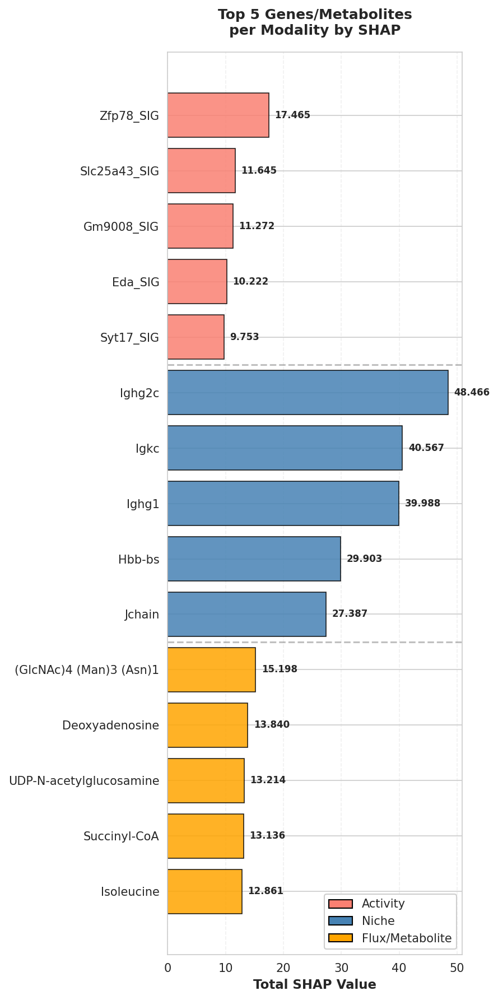

SUMMARY: TOP 5 BY MODALITY

ACTIVITY (Top 5):
--------------------------------------------------
  Zfp78_SIG                      SHAP = 17.4653
  Slc25a43_SIG                   SHAP = 11.6451
  Gm9008_SIG                     SHAP = 11.2717
  Eda_SIG                        SHAP = 10.2220
  Syt17_SIG                      SHAP = 9.7528

NICHE (Top 5):
--------------------------------------------------
  Ighg2c                         SHAP = 48.4662
  Igkc                           SHAP = 40.5673
  Ighg1                          SHAP = 39.9880
  Hbb-bs                         SHAP = 29.9026
  Jchain                         SHAP = 27.3872

FLUX (Top 5):
--------------------------------------------------
  (GlcNAc)4 (Man)3 (Asn)1        SHAP = 15.1980
  Deoxyadenosine                 SHAP = 13.8400
  UDP-N-acetylglucosamine        SHAP = 13.2140
  Succinyl-CoA                   SHAP = 13.1361
  Isoleucine                     SHAP = 12.8611

Figure dimensions: 6" × 12"
Resolution: 300 DPI
Sa

In [6]:
#!/usr/bin/env python3
"""
Plot top 5 genes/metabolites from each modality (Activity, Niche, Flux)
by total SHAP score in a single bar plot with modality-specific colors.

CONFIGURABLE VERSION - easily adjust figure dimensions at the top!
"""

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ============================================================
# CONFIGURATION - ADJUST THESE FOR YOUR MULTIPANEL LAYOUT
# ============================================================
FIGURE_WIDTH = 6      # inches (try 5, 6, 7, or 8)
FIGURE_HEIGHT = 12    # inches (try 10, 12, 14)
FONT_SIZE_LABELS = 10  # y-axis labels
FONT_SIZE_VALUES = 8   # value labels on bars
FONT_SIZE_LEGEND = 10  # legend
OUTPUT_DPI = 300       # resolution for saved figure
OUTPUT_DIR = Path("../Figures/Figure_1")  # output directory
# ============================================================

# Create output directory if it doesn't exist
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Input files (generated by shap_node_statistics.py)
ACTIVITY_STATS = "shap_node_stats_activity.csv"
NICHE_STATS = "shap_node_stats_niche_combined.csv"
FLUX_STATS = "shap_node_stats_flux.csv"

# Original SHAP file to get activity gene names with suffixes
ORIGINAL_ACTIVITY_SHAP = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")

# Output file
OUTPUT_FILE = OUTPUT_DIR / f"top5_multimodal_shap_{FIGURE_WIDTH}x{FIGURE_HEIGHT}.png"

# Helper function
def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from activity genes."""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene

# Colors from Sankey code
COLORS = {
    "Activity": "salmon",       # from palette["ACTIVITY"]
    "Niche": "steelblue",       # from palette["NICHE"]
    "Flux": "#FFA500"           # from flux_color = "#FFA500"
}

# Styling
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 150

# ============================================================
# LOAD DATA
# ============================================================

print(f"Creating figure with dimensions: {FIGURE_WIDTH}\" × {FIGURE_HEIGHT}\" at {OUTPUT_DPI} DPI")
print(f"Output directory: {OUTPUT_DIR}\n")
print("Loading statistics files...\n")

activity_df = pd.read_csv(ACTIVITY_STATS)
niche_df = pd.read_csv(NICHE_STATS)
flux_df = pd.read_csv(FLUX_STATS)

# Load original SHAP file to get activity gene names WITH suffixes
print("Loading original activity gene names with suffixes...")
original_shap = pd.read_csv(ORIGINAL_ACTIVITY_SHAP)
original_shap = original_shap.rename(columns={"Source": "source", "Target": "target"})

# Create mapping: cleaned name -> original name with suffix
activity_name_map = {}
for orig_name in original_shap["source"].unique():
    cleaned = remove_suffix(str(orig_name))
    # Keep the first occurrence (they should all have same suffix anyway)
    if cleaned not in activity_name_map:
        activity_name_map[cleaned] = str(orig_name)

print(f"Mapped {len(activity_name_map)} activity genes to their original names with suffixes\n")

print(f"Loaded {len(activity_df)} Activity nodes")
print(f"Loaded {len(niche_df)} Niche nodes")
print(f"Loaded {len(flux_df)} Flux nodes\n")

# ============================================================
# EXTRACT TOP 5 FROM EACH MODALITY
# ============================================================

# Top 5 Activity genes - restore original names with suffixes
top5_activity = activity_df.nlargest(5, "total_shap")[["gene", "total_shap"]].copy()
top5_activity["gene"] = top5_activity["gene"].map(lambda x: activity_name_map.get(x, x))
top5_activity["modality"] = "Activity"

# Top 5 Niche genes (using combined SHAP)
top5_niche = niche_df.nlargest(5, "total_shap_combined")[["gene", "total_shap_combined"]].copy()
top5_niche = top5_niche.rename(columns={"total_shap_combined": "total_shap"})
top5_niche["modality"] = "Niche"

# Top 5 Flux metabolites
top5_flux = flux_df.nlargest(5, "total_shap")[["gene", "total_shap"]].copy()
top5_flux["modality"] = "Flux"

# Combine all
combined = pd.concat([top5_activity, top5_niche, top5_flux], ignore_index=True)

# Use gene names directly without modality labels
combined["label"] = combined["gene"]

print("Top 5 genes/metabolites per modality:\n")
print(combined.to_string(index=False))
print()

# ============================================================
# CREATE BAR PLOT
# ============================================================

# Sort by modality order (Activity, Niche, Flux) and then by SHAP within each
modality_order = ["Activity", "Niche", "Flux"]
combined["modality_cat"] = pd.Categorical(
    combined["modality"], 
    categories=modality_order, 
    ordered=True
)
combined = combined.sort_values(["modality_cat", "total_shap"], ascending=[True, False])

# Create figure with configurable dimensions
fig, ax = plt.subplots(figsize=(FIGURE_WIDTH, FIGURE_HEIGHT))

# Create color list based on modality
colors = [COLORS[mod] for mod in combined["modality"]]

# Horizontal bar plot
y_positions = range(len(combined))
ax.barh(y_positions, combined["total_shap"], color=colors, alpha=0.85, edgecolor="black", linewidth=0.8)

# Customize y-axis
ax.set_yticks(y_positions)
ax.set_yticklabels(combined["label"], fontsize=FONT_SIZE_LABELS)
ax.invert_yaxis()  # Highest values at top

# Labels and title - adjust based on width
if FIGURE_WIDTH < 7:
    title_text = "Top 5 Genes/Metabolites\nper Modality by SHAP"
    xlabel_size = 11
    title_size = 12
else:
    title_text = "Top 5 Genes/Metabolites per Modality by SHAP Score"
    xlabel_size = 12
    title_size = 13

ax.set_xlabel("Total SHAP Value", fontsize=xlabel_size, fontweight="bold")
ax.set_title(title_text, fontsize=title_size, fontweight="bold", pad=15)

# Grid
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Add value labels on bars
for i, (idx, row) in enumerate(combined.iterrows()):
    shap_val = row["total_shap"]
    ax.text(shap_val + 0.02 * ax.get_xlim()[1], i, f"{shap_val:.3f}", 
            va='center', fontsize=FONT_SIZE_VALUES, fontweight='bold')

# Add legend for modalities
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=COLORS["Activity"], edgecolor='black', label='Activity'),
    Patch(facecolor=COLORS["Niche"], edgecolor='black', label='Niche'),
    Patch(facecolor=COLORS["Flux"], edgecolor='black', label='Flux/Metabolite')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=FONT_SIZE_LEGEND, framealpha=0.95)

# Add dividing lines between modalities
activity_count = (combined["modality"] == "Activity").sum()
niche_count = (combined["modality"] == "Niche").sum()

# Line after Activity section
ax.axhline(y=activity_count - 0.5, color='gray', linestyle='--', linewidth=1.5, alpha=0.5)
# Line after Niche section
ax.axhline(y=activity_count + niche_count - 0.5, color='gray', linestyle='--', linewidth=1.5, alpha=0.5)

plt.tight_layout()
plt.savefig(OUTPUT_FILE, bbox_inches='tight', dpi=OUTPUT_DPI)
print(f"✓ Saved {OUTPUT_FILE} at {OUTPUT_DPI} DPI\n")
plt.show()

# ============================================================
# SUMMARY TABLE
# ============================================================

print("="*80)
print("SUMMARY: TOP 5 BY MODALITY")
print("="*80)

for modality in modality_order:
    subset = combined[combined["modality"] == modality]
    print(f"\n{modality.upper()} (Top 5):")
    print("-" * 50)
    for idx, row in subset.iterrows():
        print(f"  {row['gene']:<30} SHAP = {row['total_shap']:.4f}")

print("\n" + "="*80)
print(f"Figure dimensions: {FIGURE_WIDTH}\" × {FIGURE_HEIGHT}\"")
print(f"Resolution: {OUTPUT_DPI} DPI")
print(f"Saved to: {OUTPUT_FILE}")
print("="*80)

Found 9 edges connecting target genes to each other

CONNECTIONS BETWEEN: Gli3, COL1A1, CNTFR, FZD3, LGALS1, VIM

Edges found:
  Fzd3_SIG                  → Lgals1          : 0.4303
  Cntfr_SIG                 → Lgals1          : 0.3541
  Gli3_SIG                  → Lgals1          : 0.2620
  Fzd3_SIG                  → Col1a1          : 0.2184
  Gli3_SIG                  → Col1a1          : 0.1836
  Cntfr_SIG                 → Col1a1          : 0.1805
  Gli3_SIG                  → Vim             : 0.1506
  Fzd3_SIG                  → Vim             : 0.1077
  Cntfr_SIG                 → Vim             : 0.0883

Total edges: 9

✓ Saved alluvial_gli3_subset_only.html
  Nodes: 3 Activity → 3 Niche
  Links: 9 total edges



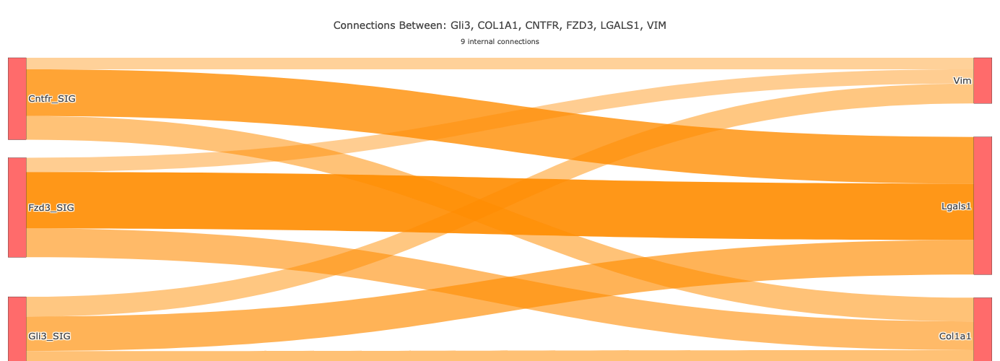

In [18]:
#!/usr/bin/env python3
"""
2-column Sankey: Activity → Niche (Only connections BETWEEN target genes)
- Shows only edges where both source AND target are in the target gene list
- Rank-based color gradients for each column
"""

import pandas as pd
import numpy as np
import plotly.graph_objects as go
from matplotlib import cm, colors as mpl_colors
from pathlib import Path

# ---------- LAYOUT KNOBS ----------
WIDTH        = 800
HEIGHT       = 500
FONT_SIZE    = 13
NODE_THICK   = 25
NODE_PAD     = 25
V_SPREAD     = 0.88
# ----------------------------------

# ---------- USER INPUT ----------
CSV2 = Path("../Mongoose_post_hoc/activity_to_niche_shap_edges_with_ranks_cluster0_20251204_163857.csv")

# Genes to include in the plot
TARGET_GENES = ["Gli3", "COL1A1", "CNTFR", "FZD3", "LGALS1", "VIM"]

CLUSTERS     = None
MIN_WEIGHT   = 0.0  # Include all connections for these genes
OUT_HTML     = "alluvial_gli3_subset_only.html"
SHOW_FIG     = True
# ---------------------------------

# ---------- helpers ----------
def remove_suffix(gene_name):
    """Remove _TF or _SIG suffix from gene names"""
    gene = str(gene_name)
    if gene.endswith("_TF") or gene.endswith("_SIG"):
        return gene.rsplit("_", 1)[0]
    return gene

def to_hex(v01, cmap="Oranges"):
    rgba = cm.get_cmap(cmap)(float(np.clip(v01, 0, 1)))
    return mpl_colors.to_hex(rgba)

def side_colors(names, ranks, cmap, fallback_intensity=0.4):
    arr = np.array(ranks, dtype=float)
    finite = np.isfinite(arr)
    if finite.any():
        rmin, rmax = np.nanmin(arr[finite]), np.nanmax(arr[finite])
        span = (rmax - rmin) if rmax != rmin else 1.0
        v01  = np.where(finite, (rmax - arr) / span, np.nan)  # best→1
        v01  = np.nan_to_num(v01, nan=0.15)
        v01  = 0.15 + 0.85 * v01
    else:
        v01 = np.full(len(names), fallback_intensity)
    return [to_hex(v, cmap) for v in v01], v01

def order_by_rank(names, best_series):
    recs = [(n, best_series.get(n, np.inf)) for n in names]
    recs.sort(key=lambda t: (not np.isfinite(t[1]), t[1]))  # NaNs last
    ordered_names  = [n for n, _ in recs]
    ordered_ranks  = [r if np.isfinite(r) else np.nan for _, r in recs]
    return ordered_names, ordered_ranks

def _normalize_columns(df):
    return df.rename(columns={
        "Cluster":"cluster","Source":"source","Target":"target","Value":"value","Direction":"direction",
        "Niche_rank":"niche_rank","Activity_rank":"activity_rank","Flux_rank":"flux_rank"
    })

def _local_y_positions(n, v_spread=0.88):
    if n <= 1: return [0.5]
    top    = (1.0 - v_spread) / 2.0
    bottom = 1.0 - top
    return np.linspace(top, bottom, n).tolist()

def load_and_filter_genes(csv_path, target_genes, clusters=None, min_weight=0.0):
    """Load CSV and filter for edges where BOTH source and target are in target_genes"""
    df = pd.read_csv(csv_path)
    df = _normalize_columns(df)
    
    if clusters is not None and "cluster" in df.columns:
        df = df[df["cluster"].isin(clusters)].copy()
    
    for c in ["value","niche_rank","activity_rank","flux_rank"]:
        if c in df.columns: 
            df[c] = pd.to_numeric(df[c], errors="coerce")
    
    df = df.dropna(subset=["source","target","value"])
    
    # Create uppercase set of target genes for matching
    target_set = {g.upper() for g in target_genes}
    
    # Filter for edges where BOTH source (with suffix removed) AND target are in target genes
    mask = (
        df["source"].astype(str).apply(lambda x: remove_suffix(x).upper()).isin(target_set) &
        df["target"].astype(str).str.upper().isin(target_set)
    )
    
    df_filtered = df[mask].copy()
    
    print(f"Found {len(df_filtered)} edges connecting target genes to each other")
    
    edges = (df_filtered.groupby(["source","target"], as_index=False)["value"].sum()
               .sort_values("value", ascending=False))
    edges = edges[edges["value"] >= min_weight]
    
    return edges, df_filtered

# ---------- main ----------
def main():
    # Load CSV and filter for target genes
    edges, df = load_and_filter_genes(CSV2, TARGET_GENES, CLUSTERS, MIN_WEIGHT)
    
    if edges.empty:
        raise SystemExit(f"No connections found BETWEEN specified genes: {TARGET_GENES}")
    
    # Print connection summary
    print(f"\n{'='*70}")
    print(f"CONNECTIONS BETWEEN: {', '.join(TARGET_GENES)}")
    print(f"{'='*70}")
    print(f"\nEdges found:")
    for _, row in edges.iterrows():
        print(f"  {row['source']:<25} → {row['target']:<15} : {row['value']:.4f}")
    print(f"\nTotal edges: {len(edges)}")
    print(f"{'='*70}\n")
    
    # Extract unique nodes for each column
    activity_nodes = edges["source"].astype(str).unique()
    niche_nodes = edges["target"].astype(str).unique()
    
    # Get ranks for ordering and coloring
    activity_ranks = df.groupby("source")["activity_rank"].min() if "activity_rank" in df.columns else pd.Series(dtype=float)
    niche_ranks = df.groupby("target")["niche_rank"].min() if "niche_rank" in df.columns else pd.Series(dtype=float)
    
    # Order nodes by rank
    if len(activity_ranks) > 0:
        ordered_activity, activity_rank_vals = order_by_rank(activity_nodes, activity_ranks)
    else:
        ordered_activity, activity_rank_vals = list(activity_nodes), [np.nan]*len(activity_nodes)
        
    if len(niche_ranks) > 0:
        ordered_niche, niche_rank_vals = order_by_rank(niche_nodes, niche_ranks)
    else:
        ordered_niche, niche_rank_vals = list(niche_nodes), [np.nan]*len(niche_nodes)
    
    # All nodes are target genes, so use red color for all
    activity_colors = ["#FF6B6B"] * len(ordered_activity)
    niche_colors = ["#FF6B6B"] * len(ordered_niche)
    
    # Combine all nodes
    all_nodes = ordered_activity + ordered_niche
    all_colors = activity_colors + niche_colors
    node_idx = {n: i for i, n in enumerate(all_nodes)}
    
    # Calculate positions
    n_activity = len(ordered_activity)
    n_niche = len(ordered_niche)
    
    y_activity = _local_y_positions(n_activity, V_SPREAD)
    y_niche = _local_y_positions(n_niche, V_SPREAD)
    
    # X positions for two columns
    x_positions = (
        [0.01] * n_activity +        # Column 1: Activity (left)
        [0.99] * n_niche             # Column 2: Niche (right)
    )
    
    y_positions = y_activity + y_niche
    
    # Build links
    links_source = []
    links_target = []
    links_value = []
    
    # Links from Activity → Niche
    for _, row in edges.iterrows():
        src = str(row["source"])
        tgt = str(row["target"])
        if src in node_idx and tgt in node_idx:
            links_source.append(node_idx[src])
            links_target.append(node_idx[tgt])
            links_value.append(float(row["value"]))
    
    # Color links based on edge strength - use orange gradient
    max_val = max(links_value) if links_value else 1
    min_val = min(links_value) if links_value else 0
    val_range = max_val - min_val if max_val != min_val else 1
    
    link_colors = []
    for val in links_value:
        # Normalize value to 0-1
        norm_val = (val - min_val) / val_range
        # Use gradient from light orange to dark orange
        opacity = 0.4 + 0.5 * norm_val  # 0.4 to 0.9 opacity
        # Orange color
        link_colors.append(f"rgba(255, 140, 0, {opacity})")
    
    # Create Sankey
    fig = go.Figure(data=[go.Sankey(
        arrangement="snap",
        node=dict(
            pad=NODE_PAD,
            thickness=NODE_THICK,
            line=dict(color="black", width=0.3),
            label=all_nodes,
            color=all_colors,
            x=x_positions,
            y=y_positions,
            hovertemplate="%{label}<extra></extra>",
        ),
        link=dict(
            source=links_source,
            target=links_target,
            value=links_value,
            color=link_colors,
            line=dict(width=0),
            hovertemplate="Source: %{source.label}<br>Target: %{target.label}<br>SHAP: %{value:.4f}<extra></extra>",
        )
    )])
    
    fig.update_layout(
        title=dict(
            text=f"Connections Between: {', '.join(TARGET_GENES)}<br><sub>{len(edges)} internal connections</sub>",
            font=dict(size=14)
        ),
        font=dict(size=FONT_SIZE),
        height=HEIGHT, 
        width=WIDTH,
        margin=dict(l=10, r=10, t=80, b=10),
        template="none",
        paper_bgcolor="rgba(0,0,0,0)",
        plot_bgcolor="rgba(0,0,0,0)",
    )
    
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)
    
    fig.write_html(OUT_HTML, include_plotlyjs="cdn")
    print(f"✓ Saved {OUT_HTML}")
    print(f"  Nodes: {n_activity} Activity → {n_niche} Niche")
    print(f"  Links: {len(links_source)} total edges\n")
    
    if SHOW_FIG:
        fig.show()

if __name__ == "__main__":
    main()